In [1]:
# ============================================
# Parkinson's Disease vs Control EEG Classifier
# Full Pipeline: BIDS loading, Preprocessing, ICA, Feature Extraction, ML
# Dataset: ds002778 (BIDS format)
# ============================================

import os
import os.path as op
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mne
from mne.datasets import sample
from mne_bids import BIDSPath, read_raw_bids, get_entity_vals
from mne.preprocessing import ICA, create_eog_epochs
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

In [2]:
import os
import openneuro

# Define BIDS root folder
bids_root = "PD3"
os.makedirs(bids_root, exist_ok=True)

# Download dataset (all subjects, all sessions)
#openneuro.download(dataset="ds003506", target_dir=bids_root)

print("✅ Download complete.")


✅ Download complete.


In [3]:
import os

subjects = [d for d in os.listdir(bids_root) if d.startswith("sub-")]
print(f"👥 Subjects found ({len(subjects)} total):")
for subject in subjects:
    print(f" - {subject}")


👥 Subjects found (56 total):
 - sub-021
 - sub-026
 - sub-019
 - sub-010
 - sub-017
 - sub-028
 - sub-043
 - sub-044
 - sub-016
 - sub-029
 - sub-011
 - sub-027
 - sub-018
 - sub-020
 - sub-045
 - sub-042
 - sub-051
 - sub-056
 - sub-002
 - sub-005
 - sub-033
 - sub-034
 - sub-050
 - sub-035
 - sub-032
 - sub-004
 - sub-003
 - sub-047
 - sub-040
 - sub-049
 - sub-025
 - sub-022
 - sub-014
 - sub-013
 - sub-048
 - sub-041
 - sub-046
 - sub-012
 - sub-015
 - sub-023
 - sub-024
 - sub-039
 - sub-006
 - sub-001
 - sub-008
 - sub-037
 - sub-030
 - sub-055
 - sub-052
 - sub-031
 - sub-009
 - sub-036
 - sub-038
 - sub-007
 - sub-053
 - sub-054


In [4]:
import os
import pandas as pd
import torch
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Load TSV participants file
tsv_path = "PD3/56participants.tsv"
tsv_df = pd.read_csv(tsv_path, sep="\t")
tsv_df.columns = tsv_df.columns.str.strip()

# Format participant IDs (e.g., sub-001)
def format_participant_id(x):
    try:
        return f"sub-{int(str(x).strip().replace('sub-', '')):03d}"
    except:
        return np.nan

tsv_df["participant_id"] = tsv_df["participant_id"].apply(format_participant_id)

# Encode sex (Male=1, Female=0)
le_gender = LabelEncoder()
tsv_df["sex_encoded"] = le_gender.fit_transform(tsv_df["sex"].astype(str).str.strip())

# Initialize data holders
features = []
labels = []
subject_ids = []

bids_root = "PD3"  # EEG folder

for subject in sorted(os.listdir(bids_root)):
    subj_path = os.path.join(bids_root, subject)
    if not os.path.isdir(subj_path) or not subject.startswith("sub-"):
        continue

    subj_row = tsv_df[tsv_df["participant_id"] == subject]
    if subj_row.empty:
        print(f"❌ Skipping {subject}: not in TSV metadata")
        continue

    subj_row = subj_row.iloc[0]
    age = subj_row.get("age", np.nan)
    gender = subj_row.get("sex_encoded", np.nan)

    # Loop sessions in folder
    for session in os.listdir(subj_path):
        if not session.startswith("ses-"):
            continue
        session_path = os.path.join(subj_path, session)
        if not os.path.isdir(session_path):
            continue

        # Determine label depending on group and medication status for this session
        group = subj_row["Group"].strip()  # 'CTL' or 'PD'
        label = None

        if group == "CTL":
            label = 0  # Control for any session
        elif group == "PD":
            # Medication status column depends on session
            if session == "ses-01":
                med_status = subj_row.get("sess1_Med", "").strip().upper()
            elif session == "ses-02":
                med_status = subj_row.get("sess2_Med", "").strip().upper()
            else:
                med_status = ""

            if med_status == "ON":
                label = 1  # PD-On
            elif med_status == "OFF":
                label = 2  # PD-Off

        if label is None:
            print(f"⚠️ Skipping {subject} {session}: cannot determine label")
            continue

        feature_vector = [age, gender]
        features.append(np.array(feature_vector))
        labels.append(label)
        subject_ids.append(f"{subject}_{session}")

# Convert to tensors
features_tensor = torch.tensor(features, dtype=torch.float32)
labels_tensor = torch.tensor(labels, dtype=torch.long)

print(f"✅ Features shape: {features_tensor.shape}")
print(f"✅ Labels shape: {labels_tensor.shape}")
print(f"🧮 Label counts: {np.bincount(labels_tensor.numpy())}")


✅ Features shape: torch.Size([84, 2])
✅ Labels shape: torch.Size([84])
🧮 Label counts: [28 28 28]


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/3471394660.py:84: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:257.)
  features_tensor = torch.tensor(features, dtype=torch.float32)


## Step 1: Define Feature Extraction Function

## Step 2: Preprocess and Extract for Subject

In [5]:
import numpy as np
from scipy.stats import skew
from sklearn.decomposition import PCA

def extract_band_power_epochs(
    epochs,
    bands=[(1, 4), (4, 8), (8, 13), (13, 30)],  # Frequency bands
    compress=False,  # If True, aggregate band power stats per epoch
    apply_pca=True,  # Apply PCA to reduce dimensions
    pca_components=50  # Number of PCA components to retain
):
    """
    Extract band power features from EEG epochs.

    Parameters:
    - epochs: mne.Epochs object
    - bands: list of (fmin, fmax) frequency tuples
    - compress: If True, use mean, std, skew aggregated over channels per band (lower-dim features).
                If False, return band power for each channel and each band (higher-dim).
    - apply_pca: If True, apply PCA to reduce dimensionality.
    - pca_components: Number of PCA components to keep (int or None for auto).

    Returns:
    - X: ndarray of shape (n_epochs, n_features) feature matrix.
    - feature_names: list of feature names (empty if PCA applied).
    - pca_model: trained PCA object or None.
    """
    # Compute PSD using Welch method (recommended)
    psd = epochs.compute_psd(method='welch')
    psd_data, freqs = psd.get_data(return_freqs=True)  # (n_epochs, n_channels, n_freqs)
    ch_names = epochs.info['ch_names']

    X = []

    if compress:
        feature_names = []
        for fmin, fmax in bands:
            band_label = f"{int(fmin)}-{int(fmax)}Hz"
            feature_names.extend([f"{band_label}_mean", f"{band_label}_std", f"{band_label}_skew"])

        for epoch_psd in psd_data:
            features = []
            for fmin, fmax in bands:
                freq_idx = np.logical_and(freqs >= fmin, freqs <= fmax)
                band_power = epoch_psd[:, freq_idx].mean(axis=1)  # mean over frequencies per channel
                # Aggregate statistics across channels
                features.extend([
                    np.mean(band_power),      # mean across channels
                    np.std(band_power),       # std dev across channels
                    skew(band_power)          # skewness across channels
                ])
            X.append(features)

    else:
        feature_names = []
        for fmin, fmax in bands:
            for ch in ch_names:
                feature_names.append(f"{int(fmin)}-{int(fmax)}Hz_{ch}")

        for epoch_psd in psd_data:
            features = []
            for fmin, fmax in bands:
                freq_idx = np.logical_and(freqs >= fmin, freqs <= fmax)
                band_power = epoch_psd[:, freq_idx].mean(axis=1)  # mean over frequencies per channel
                features.extend(band_power.tolist())  # raw band power per channel
            X.append(features)

    X = np.array(X)

    pca_model = None
    if apply_pca:
        n_samples, n_features = X.shape
        if pca_components is None or pca_components > min(n_samples, n_features):
            pca_components = min(n_samples, n_features)
            print(f"Auto-adjusting PCA components to {pca_components}")

        print(f"Applying PCA: reducing {X.shape[1]} → {pca_components} features")
        pca_model = PCA(n_components=pca_components, random_state=42)
        X = pca_model.fit_transform(X)
        feature_names = [f"PCA_{i+1}" for i in range(X.shape[1])]

    return X, feature_names, pca_model


## Step 3: Loop Over All Subjects

### Debug

## Step 4: Train ML Classifier

### Train Random Forest Classifier

In [6]:
#!/usr/bin/env python3
# pd3_pipeline.py
import os
import time
import numpy as np
import mne
from mne.preprocessing import ICA
from sklearn.decomposition import PCA

# ----------------------------
# CONFIG
# ----------------------------
BIDS_ROOT = "PD3"            # change if needed
EPOCH_LENGTH = 2.0           # seconds
EPOCH_OVERLAP = 1.0          # seconds (so 50% overlap)
BANDS = [(1, 4), (4, 8), (8, 13), (13, 30), (30, 40)]
APPLY_PCA = True
PCA_COMPONENTS = 50

# ----------------------------
# 1) BANDPOWER FEATURE EXTRACTION
# ----------------------------
def extract_band_power_epochs(epochs, bands=BANDS, apply_pca=APPLY_PCA, pca_components=PCA_COMPONENTS):
    """
    epochs: mne.Epochs (already preprocessed)
    returns: X (n_epochs, n_features), feature_names, pca_model (or None)
    """
    if epochs is None or len(epochs) == 0:
        return np.empty((0, 0)), [], None

    # compute PSD (Welch default) quietly
    psd = epochs.compute_psd(method='welch', verbose=False)
    try:
        psd_data, freqs = psd.get_data(return_freqs=True)
    except Exception:
        psd_data = psd.get_data()
        freqs = psd.freqs

    ch_names = epochs.info['ch_names']

    # build feature names for raw per-channel bandpower
    feature_names = [f"{int(fmin)}-{int(fmax)}Hz_{ch}" for (fmin, fmax) in bands for ch in ch_names]

    X_list = []
    for epoch_psd in psd_data:  # epoch_psd shape: (n_channels, n_freqs)
        features = []
        for fmin, fmax in bands:
            idx = np.logical_and(freqs >= fmin, freqs <= fmax)
            if np.sum(idx) == 0:
                band_power = np.zeros(len(ch_names))
            else:
                band_power = epoch_psd[:, idx].mean(axis=1)  # mean across frequencies -> per channel
            features.extend(band_power.tolist())
        X_list.append(features)

    X = np.array(X_list)  # shape (n_epochs, n_bands * n_channels)
    pca_model = None

    if apply_pca and X.size > 0:
        n_samples, n_features = X.shape
        n_keep = pca_components
        if pca_components is None or pca_components > min(n_samples, n_features):
            n_keep = min(n_samples, n_features)
            print(f"Auto-adjusting PCA to {n_keep} components")
        pca_model = PCA(n_components=n_keep, random_state=42)
        X = pca_model.fit_transform(X)
        feature_names = [f"PCA_{i+1}" for i in range(X.shape[1])]

    return X, feature_names, pca_model

# ----------------------------
# 2) SESSION CATEGORY HELPER (BIDS logic ses-01 / ses-02)
# ----------------------------
def categorize_session_from_bids(subject_path, session_name):
    """
    If subject folder contains both ses-01 and ses-02:
      ses-01 -> 'pd-off', ses-02 -> 'pd-on'
    If only ses-01 exists -> 'ctl'
    else 'unknown'
    """
    sessions = [d.lower() for d in os.listdir(subject_path) if os.path.isdir(os.path.join(subject_path, d))]
    s = session_name.lower()
    if 'ses-02' in sessions:
        if s == 'ses-01':
            return 'pd-off'
        if s == 'ses-02':
            return 'pd-on'
    else:
        if s == 'ses-01':
            return 'ctl'
    return 'unknown'

# ----------------------------
# 3) Robust PREPROCESS + EPOCHING (handles boundaries by segmenting)
# ----------------------------
def preprocess_and_epoch(raw, epoch_length=EPOCH_LENGTH, overlap=EPOCH_OVERLAP, verbose=False):
    """
    Input: raw (mne.Raw)
    Output: epochs (mne.Epochs) built from continuous segments that do NOT cross 'boundary' annotations.
    """
    if verbose:
        print("Preproc: set montage, ref, filtering")

    # ensure montage present (harmless if channels don't match)
    try:
        raw.set_montage("standard_1020", on_missing="ignore", verbose=False)
    except Exception:
        pass

    # basic filters & ref
    try:
        raw.set_eeg_reference('average', verbose=False)
    except Exception:
        pass
    raw.filter(l_freq=1.0, h_freq=40.0, fir_design='firwin', verbose=False)
    raw.notch_filter(freqs=60.0, verbose=False)

    # split by boundary annotations (if present)
    anns = raw.annotations
    if len(anns) > 0 and any('boundary' in (d or '') for d in anns.description):
        # boundary onsets are in seconds already
        mask = np.array([('boundary' in (d or '')) for d in anns.description])
        boundary_onsets = np.asarray(anns.onset)[mask].astype(float)
        # create segments between boundaries; keep segments >= epoch_length
        seg_starts = np.concatenate(([0.0], boundary_onsets))
        seg_ends = np.concatenate((boundary_onsets, [float(raw.times[-1])]))
        segments = [(float(s), float(e)) for s, e in zip(seg_starts, seg_ends) if (e - s) >= epoch_length]
        if verbose:
            print(f"Found {len(segments)} continuous segments (avoiding boundaries).")
    else:
        segments = [(0.0, float(raw.times[-1]))]

    epochs_list = []
    for seg_idx, (t0, t1) in enumerate(segments):
        raw_seg = raw.copy().crop(tmin=t0, tmax=t1, include_tmax=False)
        if len(raw_seg.times) < int(epoch_length * raw_seg.info['sfreq']):
            continue

        # interpolate bads if present
        if raw_seg.info.get('bads', []):
            try:
                raw_seg.interpolate_bads(reset_bads=True)
            except Exception:
                pass

        # ICA adaptive: try n_components by explained variance
        ica = None
        try:
            ica = ICA(n_components=0.999, random_state=97, max_iter=800, verbose=False)
            ica.fit(raw_seg)
        except Exception:
            try:
                ica = ICA(n_components=min(20, len(raw_seg.ch_names)), random_state=97, max_iter=800, verbose=False)
                ica.fit(raw_seg)
            except Exception:
                ica = None
                if verbose:
                    print(f"ICA failed on segment {seg_idx}; continuing without ICA")

        if ica is not None:
            # try removing EOG components if any EOG-like channel present
            eog_chs = [ch for ch in ['EXG1','EXG2','EXG3','EXG4','VEOG','HEOG','EOG'] if ch in raw_seg.ch_names]
            if len(eog_chs) > 0:
                try:
                    eog_inds, _ = ica.find_bads_eog(raw_seg, ch_name=eog_chs[0])
                    ica.exclude = eog_inds
                except Exception:
                    pass
            try:
                raw_seg = ica.apply(raw_seg)
            except Exception:
                pass

        # create overlapping events inside this cropped segment (no crossing boundaries)
        sfreq = raw_seg.info['sfreq']
        step = epoch_length - overlap
        if step <= 0:
            raise ValueError("overlap must be smaller than epoch_length")
        n_samples = len(raw_seg.times)
        # generate event start sample indices (relative to raw_seg)
        event_starts = np.arange(0, n_samples - int(epoch_length * sfreq) + 1, int(step * sfreq), dtype=int)
        if len(event_starts) == 0:
            continue
        # map to global sample indices
        event_samples_global = (event_starts + int(raw_seg.first_samp)).astype(int)
        events = np.column_stack((event_samples_global, np.zeros(len(event_samples_global), dtype=int), np.ones(len(event_samples_global), dtype=int)))

        try:
            epochs_seg = mne.Epochs(raw_seg, events, event_id=1, tmin=0.0, tmax=epoch_length, baseline=None, preload=True, detrend=1, verbose=False)
            if len(epochs_seg) > 0:
                epochs_list.append(epochs_seg)
        except Exception as e:
            if verbose:
                print(f"Warning: could not create epochs for segment {seg_idx}: {e}")
            continue

    # if nothing collected, return empty EpochsArray with correct shape
    if len(epochs_list) == 0:
        n_ch = len(raw.info['ch_names'])
        data = np.empty((0, n_ch, int(epoch_length * raw.info['sfreq'])))
        try:
            return mne.EpochsArray(data, info=raw.info)
        except Exception:
            # fallback create minimal info
            info = mne.create_info(ch_names=raw.info['ch_names'], sfreq=raw.info['sfreq'], ch_types='eeg')
            return mne.EpochsArray(data, info=info)

    # concatenate epochs from segments
    epochs = mne.concatenate_epochs(epochs_list)
    return epochs

# ----------------------------
# 4) PROCESS ENTIRE BIDS FOLDER (EEGLAB .set)
# ----------------------------
def process_bids_dataset(dataset_dir=BIDS_ROOT, verbose=True):
    """
    Walk PD3, load .set files, preprocess, epoch (2s windows 1s overlap), extract bandpower features.
    Returns epoch-level X, y (numeric), subjects_epochs (per-epoch subject id), and diagnostic summaries.
    """
    X_all = []
    y_all = []
    subjects_epochs = []
    valid_subjects = {'pd-on': [], 'pd-off': [], 'ctl': []}
    sample_counts = {'pd-on': 0, 'pd-off': 0, 'ctl': 0}
    feature_counts = {'pd-on': 0, 'pd-off': 0, 'ctl': 0}
    errors = []
    total_samples = 0
    total_features = 0

    subject_dirs = sorted([d for d in os.listdir(dataset_dir) if d.startswith('sub-')])
    for subj in subject_dirs:
        subj_dir = os.path.join(dataset_dir, subj)
        sessions = sorted([d for d in os.listdir(subj_dir) if d.startswith('ses-')]) if os.path.isdir(subj_dir) else []
        if len(sessions) == 0:
            continue

        for ses in sessions:
            eeg_dir = os.path.join(subj_dir, ses, 'eeg')
            if not os.path.isdir(eeg_dir):
                continue

            set_files = [f for f in os.listdir(eeg_dir) if f.endswith('.set')]
            if len(set_files) == 0:
                if verbose:
                    print(f"No .set files for {subj} {ses} -> skipping")
                continue

            set_path = os.path.join(eeg_dir, set_files[0])
            if verbose:
                print(f"\nProcessing {subj} {ses} -> {set_path}")

            try:
                t0 = time.time()
                raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)

                # Preprocess & epoch (handles boundaries)
                epochs = preprocess_and_epoch(raw, epoch_length=EPOCH_LENGTH, overlap=EPOCH_OVERLAP, verbose=verbose)
                if epochs is None or len(epochs) == 0:
                    raise ValueError("no epochs extracted")

                # Extract features (bandpower)
                X_sub, feat_names, pca_model = extract_band_power_epochs(epochs, apply_pca=APPLY_PCA, pca_components=PCA_COMPONENTS)
                if X_sub is None or X_sub.size == 0:
                    raise ValueError("feature extraction returned empty")

                # normalize per-subject/session to reduce amplitude bias
                X_sub = (X_sub - X_sub.mean(axis=0, keepdims=True)) / (X_sub.std(axis=0, keepdims=True) + 1e-9)

                # determine label using BIDS logic
                category = categorize_session_from_bids(subj_dir, ses)
                if category == 'unknown':
                    if verbose:
                        print(f"Unknown category for {subj} {ses} -> skip")
                    continue

                # append
                n_samples = X_sub.shape[0]
                X_all.append(X_sub)
                y_all.extend([category] * n_samples)
                subjects_epochs.extend([subj] * n_samples)

                valid_subjects[category].append(f"{subj} ({ses})")
                sample_counts[category] += n_samples
                feature_counts[category] = X_sub.shape[1]

                total_samples += n_samples
                total_features = X_sub.shape[1]

                if verbose:
                    print(f"Completed {subj} {ses} -> {n_samples} epochs, {X_sub.shape[1]} features  (took {time.time()-t0:.2f}s)")

            except Exception as e:
                errors.append((subj, ses, str(e)))
                if verbose:
                    print(f"Error processing {subj} {ses}: {e}")

    # stack
    if len(X_all) == 0:
        X = np.empty((0, 0))
    else:
        X = np.vstack(X_all)

    # numeric label mapping
    label_map = {'ctl':0, 'pd-on':1, 'pd-off':2}
    y_numeric = np.array([label_map.get(lbl, -1) for lbl in y_all], dtype=int)

    subjects_epochs = np.array(subjects_epochs, dtype=object)

    # summary prints
    print("\n--- Processing summary ---")
    for k in valid_subjects:
        print(f"{k}: {len(valid_subjects[k])} sessions, {sample_counts[k]} epochs, features={feature_counts[k]}")
    print(f"Total epochs: {total_samples}, feature-dim: {total_features}")
    print(f"X shape: {X.shape}, y shape: {y_numeric.shape}")
    print(f"Label counts: {dict(zip(*np.unique(y_numeric, return_counts=True)))}")
    if len(errors) > 0:
        print("Some errors were encountered (first 10):")
        for e in errors[:10]:
            print(e)

    return X, y_numeric, subjects_epochs, valid_subjects, errors, sample_counts, feature_counts

# ----------------------------
# 5) RUN
# ----------------------------
if __name__ == "__main__":
    X, y, subjects_epochs, valid_subjects, errors, sample_counts, feature_counts = process_bids_dataset(BIDS_ROOT, verbose=True)



Processing sub-001 ses-01 -> PD3/sub-001/ses-01/eeg/sub-001_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 3 components
Fitting ICA took 1.9s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-001 ses-01 -> 1408 epochs, 50 features  (took 12.67s)

Processing sub-002 ses-01 -> PD3/sub-002/ses-01/eeg/sub-002_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 3.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


No baseline correction applied
Completed sub-002 ses-01 -> 1919 epochs, 50 features  (took 17.98s)

Processing sub-002 ses-02 -> PD3/sub-002/ses-02/eeg/sub-002_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 0.9s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-002 ses-02 -> 623 epochs, 50 features  (took 6.03s)

Processing sub-003 ses-01 -> PD3/sub-003/ses-01/eeg/sub-003_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-003 ses-01 -> 1521 epochs, 50 features  (took 13.97s)

Processing sub-003 ses-02 -> PD3/sub-003/ses-02/eeg/sub-003_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 10 components
Fitting ICA took 6.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design 

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1825 matching events found
No baseline correction applied
Completed sub-003 ses-02 -> 1825 epochs, 50 features  (took 20.23s)

Processing sub-004 ses-01 -> PD3/sub-004/ses-01/eeg/sub-004_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.4s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1634 matching events found
No baseline correction applied
Completed sub-004 ses-01 -> 1634 epochs, 50 features  (took 15.07s)

Processing sub-004 ses-02 -> PD3/sub-004/ses-02/eeg/sub-004_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.9s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-004 ses-02 -> 1286 epochs, 50 features  (took 12.11s)

Processing sub-005 ses-01 -> PD3/sub-005/ses-01/eeg/sub-005_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-005 ses-01 -> 1519 epochs, 50 features  (took 14.09s)

Processing sub-005 ses-02 -> PD3/sub-005/ses-02/eeg/sub-005_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-005 ses-02 -> 1462 epochs, 50 features  (took 13.50s)

Processing sub-006 ses-01 -> PD3/sub-006/ses-01/eeg/sub-006_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 3 components
Fitting ICA took 2.0s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-006 ses-01 -> 1518 epochs, 50 features  (took 31.58s)

Processing sub-006 ses-02 -> PD3/sub-006/ses-02/eeg/sub-006_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 3 components
Fitting ICA took 1.6s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1567 matching events found
No baseline correction applied
Completed sub-006 ses-02 -> 1567 epochs, 50 features  (took 13.99s)

Processing sub-007 ses-01 -> PD3/sub-007/ses-01/eeg/sub-007_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 17.0s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design 

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1503 matching events found
No baseline correction applied
Completed sub-007 ses-01 -> 1503 epochs, 50 features  (took 34.28s)

Processing sub-008 ses-01 -> PD3/sub-008/ses-01/eeg/sub-008_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 9 components
Fitting ICA took 6.4s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-008 ses-01 -> 1612 epochs, 50 features  (took 25.17s)

Processing sub-008 ses-02 -> PD3/sub-008/ses-02/eeg/sub-008_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 3 components
Fitting ICA took 3.0s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-008 ses-02 -> 1363 epochs, 50 features  (took 19.09s)

Processing sub-009 ses-01 -> PD3/sub-009/ses-01/eeg/sub-009_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-009 ses-01 -> 1475 epochs, 50 features  (took 39.64s)

Processing sub-010 ses-01 -> PD3/sub-010/ses-01/eeg/sub-010_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.4s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-010 ses-01 -> 1613 epochs, 50 features  (took 51.46s)

Processing sub-010 ses-02 -> PD3/sub-010/ses-02/eeg/sub-010_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-010 ses-02 -> 1370 epochs, 50 features  (took 24.45s)

Processing sub-011 ses-01 -> PD3/sub-011/ses-01/eeg/sub-011_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-011 ses-01 -> 1399 epochs, 50 features  (took 83.42s)

Processing sub-011 ses-02 -> PD3/sub-011/ses-02/eeg/sub-011_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 9 components
Fitting ICA took 18.8s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design 

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-011 ses-02 -> 1985 epochs, 50 features  (took 60.32s)

Processing sub-012 ses-01 -> PD3/sub-012/ses-01/eeg/sub-012_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 22 components
Fitting ICA took 434.8s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain desig

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 1 ICA component
    Projecting back using 67 PCA components
Not setting metadata
1473 matching events found
No baseline correction applied


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-012 ses-01 -> 1473 epochs, 50 features  (took 684.80s)

Processing sub-012 ses-02 -> PD3/sub-012/ses-02/eeg/sub-012_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.1s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-012 ses-02 -> 1298 epochs, 50 features  (took 12.32s)

Processing sub-013 ses-01 -> PD3/sub-013/ses-01/eeg/sub-013_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 27 components
Fitting ICA took 4054.8s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain desi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 1 ICA component
    Projecting back using 67 PCA components
Not setting metadata
1553 matching events found
No baseline correction applied


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-013 ses-01 -> 1553 epochs, 50 features  (took 4067.66s)

Processing sub-013 ses-02 -> PD3/sub-013/ses-02/eeg/sub-013_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.0s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-013 ses-02 -> 1379 epochs, 50 features  (took 745.17s)

Processing sub-014 ses-01 -> PD3/sub-014/ses-01/eeg/sub-014_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.1s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-014 ses-01 -> 1359 epochs, 50 features  (took 12.18s)

Processing sub-014 ses-02 -> PD3/sub-014/ses-02/eeg/sub-014_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.1s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-014 ses-02 -> 1358 epochs, 50 features  (took 12.01s)

Processing sub-015 ses-01 -> PD3/sub-015/ses-01/eeg/sub-015_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 7 components
Fitting ICA took 2.7s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-015 ses-01 -> 1284 epochs, 50 features  (took 12.29s)

Processing sub-015 ses-02 -> PD3/sub-015/ses-02/eeg/sub-015_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.7s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1766 matching events found
No baseline correction applied
Completed sub-015 ses-02 -> 1766 epochs, 50 features  (took 15.42s)

Processing sub-016 ses-01 -> PD3/sub-016/ses-01/eeg/sub-016_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.1s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-016 ses-01 -> 1435 epochs, 50 features  (took 12.58s)

Processing sub-016 ses-02 -> PD3/sub-016/ses-02/eeg/sub-016_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.7s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-016 ses-02 -> 1276 epochs, 50 features  (took 10.99s)

Processing sub-017 ses-01 -> PD3/sub-017/ses-01/eeg/sub-017_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-017 ses-01 -> 1528 epochs, 50 features  (took 13.26s)

Processing sub-017 ses-02 -> PD3/sub-017/ses-02/eeg/sub-017_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-017 ses-02 -> 1486 epochs, 50 features  (took 13.06s)

Processing sub-018 ses-01 -> PD3/sub-018/ses-01/eeg/sub-018_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-018 ses-01 -> 1511 epochs, 50 features  (took 13.45s)

Processing sub-018 ses-02 -> PD3/sub-018/ses-02/eeg/sub-018_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.9s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-018 ses-02 -> 1394 epochs, 50 features  (took 12.02s)

Processing sub-019 ses-01 -> PD3/sub-019/ses-01/eeg/sub-019_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-019 ses-01 -> 1581 epochs, 50 features  (took 14.08s)

Processing sub-019 ses-02 -> PD3/sub-019/ses-02/eeg/sub-019_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.6s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


No baseline correction applied
Completed sub-019 ses-02 -> 1672 epochs, 50 features  (took 14.70s)

Processing sub-020 ses-01 -> PD3/sub-020/ses-01/eeg/sub-020_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 5 components
Fitting ICA took 2.5s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1572 matching events found
No baseline correction applied
Completed sub-020 ses-01 -> 1572 epochs, 50 features  (took 14.22s)

Processing sub-020 ses-02 -> PD3/sub-020/ses-02/eeg/sub-020_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 186.6s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-020 ses-02 -> 1268 epochs, 50 features  (took 196.28s)

Processing sub-021 ses-01 -> PD3/sub-021/ses-01/eeg/sub-021_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 760.8s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1453 matching events found
No baseline correction applied
Completed sub-021 ses-01 -> 1453 epochs, 50 features  (took 1007.50s)

Processing sub-021 ses-02 -> PD3/sub-021/ses-02/eeg/sub-021_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.1s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-021 ses-02 -> 725 epochs, 50 features  (took 972.82s)

Processing sub-022 ses-01 -> PD3/sub-022/ses-01/eeg/sub-022_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 3 components
Fitting ICA took 2.9s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-022 ses-01 -> 1632 epochs, 50 features  (took 263.01s)

Processing sub-022 ses-02 -> PD3/sub-022/ses-02/eeg/sub-022_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-022 ses-02 -> 1412 epochs, 50 features  (took 660.07s)

Processing sub-023 ses-01 -> PD3/sub-023/ses-01/eeg/sub-023_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.1s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-023 ses-01 -> 1420 epochs, 50 features  (took 13.59s)

Processing sub-023 ses-02 -> PD3/sub-023/ses-02/eeg/sub-023_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 3.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1949 matching events found
No baseline correction applied
Completed sub-023 ses-02 -> 1949 epochs, 50 features  (took 91.55s)

Processing sub-024 ses-01 -> PD3/sub-024/ses-01/eeg/sub-024_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.4s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-024 ses-01 -> 1482 epochs, 50 features  (took 109.21s)

Processing sub-024 ses-02 -> PD3/sub-024/ses-02/eeg/sub-024_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-024 ses-02 -> 1391 epochs, 50 features  (took 13.19s)

Processing sub-025 ses-01 -> PD3/sub-025/ses-01/eeg/sub-025_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 3.4s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-025 ses-01 -> 1865 epochs, 50 features  (took 36.52s)

Processing sub-025 ses-02 -> PD3/sub-025/ses-02/eeg/sub-025_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.5s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-025 ses-02 -> 1326 epochs, 50 features  (took 42.59s)

Processing sub-026 ses-01 -> PD3/sub-026/ses-01/eeg/sub-026_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 49.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design 

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-026 ses-01 -> 1577 epochs, 50 features  (took 60.77s)

Processing sub-026 ses-02 -> PD3/sub-026/ses-02/eeg/sub-026_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.5s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1482 matching events found
No baseline correction applied
Completed sub-026 ses-02 -> 1482 epochs, 50 features  (took 115.37s)

Processing sub-027 ses-01 -> PD3/sub-027/ses-01/eeg/sub-027_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.9s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-027 ses-01 -> 1398 epochs, 50 features  (took 11.98s)

Processing sub-027 ses-02 -> PD3/sub-027/ses-02/eeg/sub-027_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 9 components
Fitting ICA took 322.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1561 matching events found
No baseline correction applied
Completed sub-027 ses-02 -> 1561 epochs, 50 features  (took 341.21s)

Processing sub-028 ses-01 -> PD3/sub-028/ses-01/eeg/sub-028_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 4.0s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1714 matching events found
No baseline correction applied
Completed sub-028 ses-01 -> 1714 epochs, 50 features  (took 52.07s)

Processing sub-028 ses-02 -> PD3/sub-028/ses-02/eeg/sub-028_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 7 components
Fitting ICA took 3.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-028 ses-02 -> 1493 epochs, 50 features  (took 14.40s)

Processing sub-029 ses-01 -> PD3/sub-029/ses-01/eeg/sub-029_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-029 ses-01 -> 1504 epochs, 50 features  (took 13.43s)

Processing sub-029 ses-02 -> PD3/sub-029/ses-02/eeg/sub-029_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 4.6s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
2525 matching events found
No baseline correction applied
Completed sub-029 ses-02 -> 2525 epochs, 50 features  (took 23.67s)

Processing sub-030 ses-01 -> PD3/sub-030/ses-01/eeg/sub-030_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.6s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


1663 matching events found
No baseline correction applied
Completed sub-030 ses-01 -> 1663 epochs, 50 features  (took 15.87s)

Processing sub-030 ses-02 -> PD3/sub-030/ses-02/eeg/sub-030_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.8s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-030 ses-02 -> 1385 epochs, 50 features  (took 12.74s)

Processing sub-031 ses-01 -> PD3/sub-031/ses-01/eeg/sub-031_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.4s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-031 ses-01 -> 1318 epochs, 50 features  (took 13.06s)

Processing sub-031 ses-02 -> PD3/sub-031/ses-02/eeg/sub-031_ses-02_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.5s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-031 ses-02 -> 1426 epochs, 50 features  (took 13.86s)

Processing sub-032 ses-01 -> PD3/sub-032/ses-01/eeg/sub-032_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-032 ses-01 -> 1497 epochs, 50 features  (took 13.98s)

Processing sub-033 ses-01 -> PD3/sub-033/ses-01/eeg/sub-033_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 29 components
Fitting ICA took 40.4s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 2 ICA components
    Projecting back using 67 PCA components


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1820 matching events found
No baseline correction applied
Completed sub-033 ses-01 -> 1820 epochs, 50 features  (took 55.29s)

Processing sub-034 ses-01 -> PD3/sub-034/ses-01/eeg/sub-034_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 32 components
Fitting ICA took 31.9s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Applying ICA to Raw instance
    Transforming to ICA space (32 components)
    Zeroing out 1 ICA component
    Projecting back using 67 PCA components
Not setting metadata
1070 matching events found
No baseline correction applied


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-034 ses-01 -> 1070 epochs, 50 features  (took 40.74s)

Processing sub-035 ses-01 -> PD3/sub-035/ses-01/eeg/sub-035_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 19 components
Fitting ICA took 19.9s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s


Applying ICA to Raw instance
    Transforming to ICA space (19 components)
    Zeroing out 1 ICA component
    Projecting back using 67 PCA components


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1979 matching events found
No baseline correction applied
Completed sub-035 ses-01 -> 1979 epochs, 50 features  (took 36.13s)

Processing sub-036 ses-01 -> PD3/sub-036/ses-01/eeg/sub-036_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.8s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-036 ses-01 -> 1658 epochs, 50 features  (took 15.65s)

Processing sub-037 ses-01 -> PD3/sub-037/ses-01/eeg/sub-037_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.1s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1507 matching events found
No baseline correction applied
Completed sub-037 ses-01 -> 1507 epochs, 50 features  (took 13.96s)

Processing sub-038 ses-01 -> PD3/sub-038/ses-01/eeg/sub-038_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 5 components
Fitting ICA took 2.4s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-038 ses-01 -> 1447 epochs, 50 features  (took 13.58s)

Processing sub-039 ses-01 -> PD3/sub-039/ses-01/eeg/sub-039_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1612 matching events found
No baseline correction applied
Completed sub-039 ses-01 -> 1612 epochs, 50 features  (took 14.75s)

Processing sub-040 ses-01 -> PD3/sub-040/ses-01/eeg/sub-040_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-040 ses-01 -> 1581 epochs, 50 features  (took 14.67s)

Processing sub-041 ses-01 -> PD3/sub-041/ses-01/eeg/sub-041_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 3.6s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
2130 matching events found
No baseline correction applied
Completed sub-041 ses-01 -> 2130 epochs, 50 features  (took 20.49s)

Processing sub-042 ses-01 -> PD3/sub-042/ses-01/eeg/sub-042_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.4s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-042 ses-01 -> 1743 epochs, 50 features  (took 16.22s)

Processing sub-043 ses-01 -> PD3/sub-043/ses-01/eeg/sub-043_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-043 ses-01 -> 1546 epochs, 50 features  (took 14.60s)

Processing sub-044 ses-01 -> PD3/sub-044/ses-01/eeg/sub-044_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.9s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-044 ses-01 -> 1434 epochs, 50 features  (took 12.93s)

Processing sub-045 ses-01 -> PD3/sub-045/ses-01/eeg/sub-045_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.1s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-045 ses-01 -> 1471 epochs, 50 features  (took 13.53s)

Processing sub-046 ses-01 -> PD3/sub-046/ses-01/eeg/sub-046_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 3.0s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1751 matching events found
No baseline correction applied
Completed sub-046 ses-01 -> 1751 epochs, 50 features  (took 16.67s)

Processing sub-047 ses-01 -> PD3/sub-047/ses-01/eeg/sub-047_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-047 ses-01 -> 1517 epochs, 50 features  (took 13.78s)

Processing sub-048 ses-01 -> PD3/sub-048/ses-01/eeg/sub-048_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.0s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-048 ses-01 -> 1537 epochs, 50 features  (took 13.73s)

Processing sub-049 ses-01 -> PD3/sub-049/ses-01/eeg/sub-049_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 24 components
Fitting ICA took 21.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s


Applying ICA to Raw instance
    Transforming to ICA space (24 components)
    Zeroing out 1 ICA component
    Projecting back using 67 PCA components


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1678 matching events found
No baseline correction applied
Completed sub-049 ses-01 -> 1678 epochs, 50 features  (took 35.80s)

Processing sub-050 ses-01 -> PD3/sub-050/ses-01/eeg/sub-050_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.0s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-050 ses-01 -> 1342 epochs, 50 features  (took 12.44s)

Processing sub-051 ses-01 -> PD3/sub-051/ses-01/eeg/sub-051_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.3s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1519 matching events found
No baseline correction applied
Completed sub-051 ses-01 -> 1519 epochs, 50 features  (took 14.32s)

Processing sub-052 ses-01 -> PD3/sub-052/ses-01/eeg/sub-052_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.8s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-052 ses-01 -> 1376 epochs, 50 features  (took 12.53s)

Processing sub-053 ses-01 -> PD3/sub-053/ses-01/eeg/sub-053_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1374 matching events found
No baseline correction applied
Completed sub-053 ses-01 -> 1374 epochs, 50 features  (took 13.03s)

Processing sub-054 ses-01 -> PD3/sub-054/ses-01/eeg/sub-054_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.1s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-054 ses-01 -> 1302 epochs, 50 features  (took 12.14s)

Processing sub-055 ses-01 -> PD3/sub-055/ses-01/eeg/sub-055_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 2.2s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Not setting metadata
1588 matching events found
No baseline correction applied
Completed sub-055 ses-01 -> 1588 epochs, 50 features  (took 14.97s)

Processing sub-056 ses-01 -> PD3/sub-056/ses-01/eeg/sub-056_ses-01_task-ReinforcementLearning_eeg.set


/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:254: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_path, preload=True, verbose=False)


Preproc: set montage, ref, filtering
Found 1 continuous segments (avoiding boundaries).
Fitting ICA to data using 67 channels (please be patient, this may take a while)
Selecting by explained variance: 4 components
Fitting ICA took 1.7s.
Using EOG channel: VEOG
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (

/var/folders/xf/s2p9hhss1mn1j7qc3djhm7hw0000gn/T/ipykernel_32249/1071446606.py:209: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(epochs_list)


Completed sub-056 ses-01 -> 1270 epochs, 50 features  (took 11.51s)

--- Processing summary ---
pd-on: 28 sessions, 41053 epochs, features=50
pd-off: 28 sessions, 43057 epochs, features=50
ctl: 28 sessions, 43135 epochs, features=50
Total epochs: 127245, feature-dim: 50
X shape: (127245, 50), y shape: (127245,)
Label counts: {0: 43135, 1: 41053, 2: 43057}


In [7]:
dataset_dir = 'PD3'
subject_id = sorted(os.listdir(dataset_dir))
subject_path = os.path.join(dataset_dir, subject_id[11])
subject_path
sessions = [d for d in os.listdir(subject_path) if d.startswith("ses-")]
sessions
for session_name in sessions:
    session_path = os.path.join(subject_path, session_name, "eeg")


    # Find .set files
    set_files = [f for f in os.listdir(session_path) if f.endswith(".set")]

    set_file_path = os.path.join(session_path, set_files[0])
  
    print(f"\n🚀 Processing {subject_id} in {session_name} ...")
    


🚀 Processing ['.DS_Store', '56participants.tsv', 'CHANGES', 'README', 'code', 'dataset_description.json', 'participants.json', 'participants.tsv', 'participants56.tsv', 'stimuli', 'sub-001', 'sub-002', 'sub-003', 'sub-004', 'sub-005', 'sub-006', 'sub-007', 'sub-008', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-021', 'sub-022', 'sub-023', 'sub-024', 'sub-025', 'sub-026', 'sub-027', 'sub-028', 'sub-029', 'sub-030', 'sub-031', 'sub-032', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-042', 'sub-043', 'sub-044', 'sub-045', 'sub-046', 'sub-047', 'sub-048', 'sub-049', 'sub-050', 'sub-051', 'sub-052', 'sub-053', 'sub-054', 'sub-055', 'sub-056'] in ses-02 ...

🚀 Processing ['.DS_Store', '56participants.tsv', 'CHANGES', 'README', 'code', 'dataset_description.json', 'participants.json', 'participants.tsv', 'participants56.tsv', 'stimuli', 'sub-001

In [8]:
def subject_wise_split(X, y, subjects, test_size=0.2, random_state=42):
    unique_subjects = np.unique(subjects)
    subj_train, subj_test = train_test_split(
        unique_subjects, test_size=test_size, random_state=random_state
    )

    train_mask = np.isin(subjects, subj_train)
    test_mask = np.isin(subjects, subj_test)

    X_train, y_train = X[train_mask], y[train_mask]
    X_test, y_test = X[test_mask], y[test_mask]
    subj_train_epochs, subj_test_epochs = subjects[train_mask], subjects[test_mask]

    print(f"Train: {len(subj_train)} subjects, {len(X_train)} epochs")
    print(f"Test : {len(subj_test)} subjects, {len(X_test)} epochs")

    return X_train, X_test, y_train, y_test, subj_train_epochs, subj_test_epochs


In [9]:
from sklearn.model_selection import train_test_split

# Assuming X and y have been processed and are available

# Split data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Print the shapes of the resulting datasets
print(f"✅ Shape of X_train: {X_train.shape}")
print(f"✅ Shape of X_test: {X_test.shape}")
print(f"✅ Shape of y_train: {y_train.shape}")
print(f"✅ Shape of y_test: {y_test.shape}")

# Check the first epoch in the dataset
print(f"First sample (epoch) shape: {X[0].shape}")
print(f"First sample (epoch) data: {X[0]}")



✅ Shape of X_train: (101796, 50)
✅ Shape of X_test: (25449, 50)
✅ Shape of y_train: (101796,)
✅ Shape of y_test: (25449,)
First sample (epoch) shape: (50,)
First sample (epoch) data: [ 5.35698447e-01 -6.84540564e-02  1.69898576e-01 -7.35459416e-02
  2.29375489e-01  5.34569614e-01 -3.56587854e-01  6.33002624e-01
 -1.40988420e-01 -7.02192354e-02  2.27244637e+00  1.07111808e-01
 -3.30263994e-01  1.40624211e-01 -1.23964335e+00 -4.62237142e-01
 -1.30528756e+00  7.95473290e-01  6.64009422e-01 -1.78748645e-01
  6.64962414e-01 -3.43492649e-01 -2.65635663e-01  4.51752413e-01
  1.36373947e-01 -2.08628208e-02 -1.57791741e-02 -4.16557296e-01
  1.81081867e-02  5.94427589e-01 -8.20846670e-02  6.90421618e-02
  2.94300794e-02 -6.88051917e-02  3.33874151e-02 -1.00565788e-01
 -4.57943995e-02  1.53108350e-01  1.01846465e-01  1.55355414e-01
 -2.96751094e-02 -8.15150080e-02  6.97550281e-02  6.61610911e-02
  4.25834782e-02  1.28011352e-01 -1.02037300e-01  5.42883558e-02
  3.98134469e-04 -4.18896588e-02]



📁 Fold 1
Accuracy:  0.9465
Precision: 0.9486
Recall:    0.9462
F1-Score:  0.9467
AUC Score: 0.9959

Classification Report:
              precision    recall  f1-score   support

     Control       0.97      0.94      0.95      8627
       PD-On       0.97      0.93      0.95      8210
      PD-Off       0.90      0.97      0.94      8612

    accuracy                           0.95     25449
   macro avg       0.95      0.95      0.95     25449
weighted avg       0.95      0.95      0.95     25449



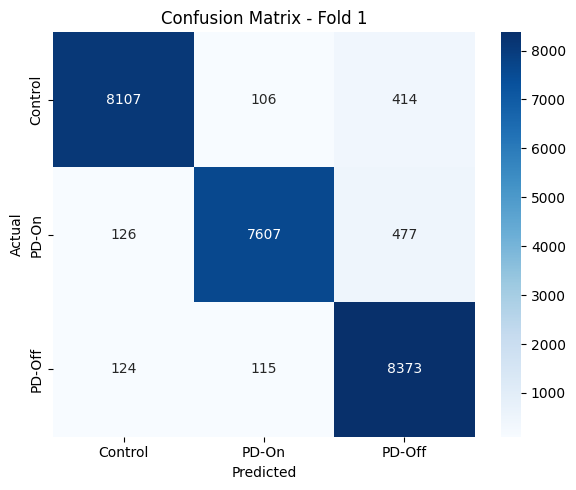

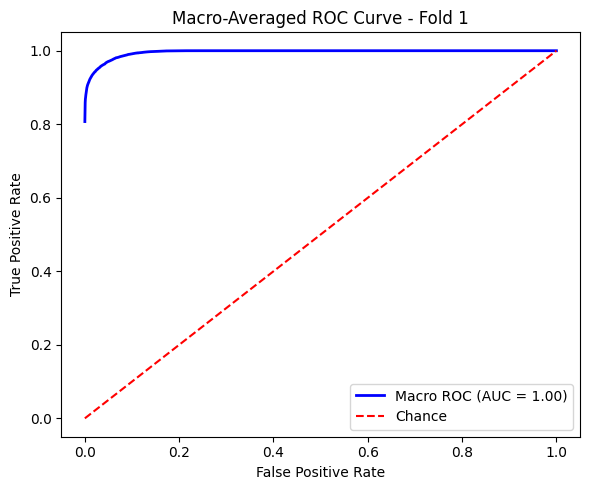


📁 Fold 2
Accuracy:  0.9455
Precision: 0.9472
Recall:    0.9453
F1-Score:  0.9457
AUC Score: 0.9957

Classification Report:
              precision    recall  f1-score   support

     Control       0.97      0.94      0.95      8627
       PD-On       0.97      0.93      0.95      8210
      PD-Off       0.91      0.97      0.94      8612

    accuracy                           0.95     25449
   macro avg       0.95      0.95      0.95     25449
weighted avg       0.95      0.95      0.95     25449



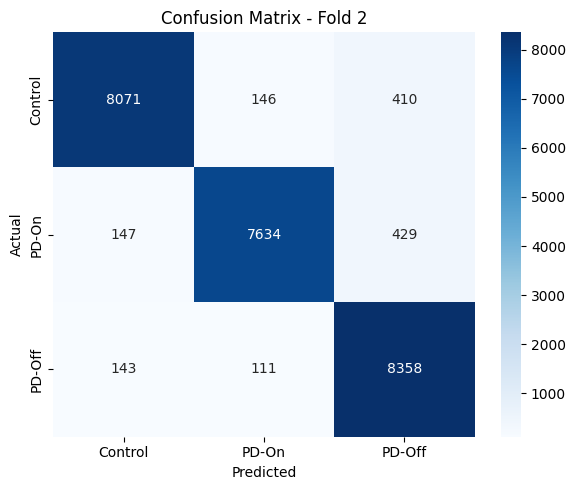

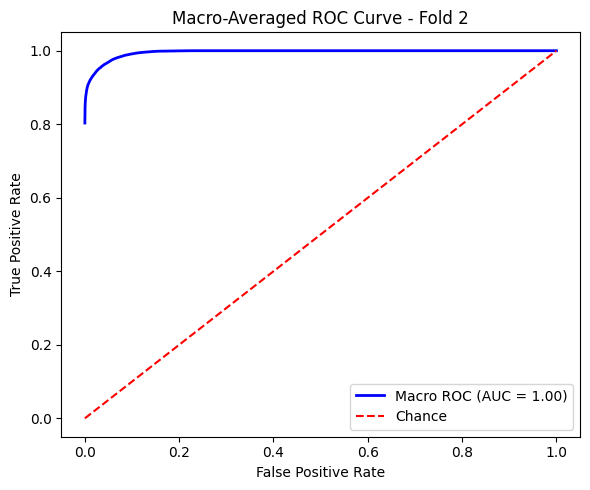


📁 Fold 3
Accuracy:  0.9446
Precision: 0.9468
Recall:    0.9443
F1-Score:  0.9448
AUC Score: 0.9957

Classification Report:
              precision    recall  f1-score   support

     Control       0.97      0.94      0.95      8627
       PD-On       0.97      0.92      0.95      8211
      PD-Off       0.90      0.97      0.94      8611

    accuracy                           0.94     25449
   macro avg       0.95      0.94      0.94     25449
weighted avg       0.95      0.94      0.94     25449



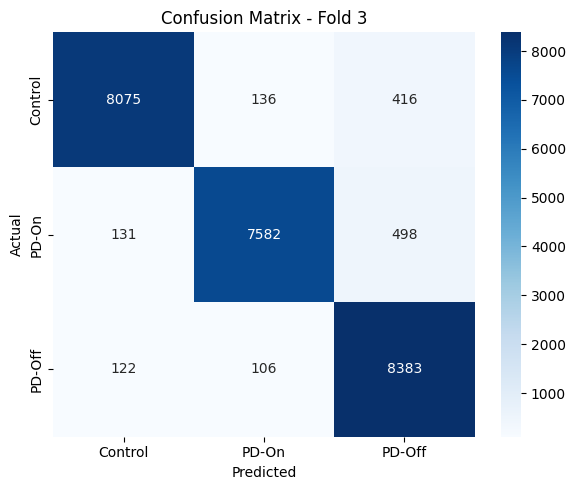

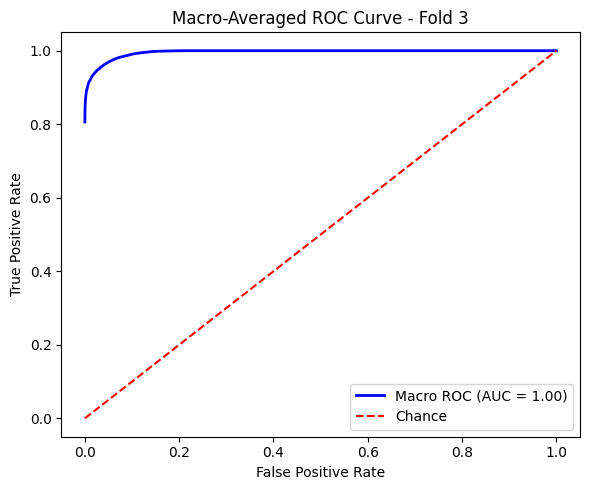


📁 Fold 4
Accuracy:  0.9475
Precision: 0.9491
Recall:    0.9471
F1-Score:  0.9476
AUC Score: 0.9959

Classification Report:
              precision    recall  f1-score   support

     Control       0.97      0.94      0.96      8627
       PD-On       0.97      0.93      0.95      8211
      PD-Off       0.91      0.97      0.94      8611

    accuracy                           0.95     25449
   macro avg       0.95      0.95      0.95     25449
weighted avg       0.95      0.95      0.95     25449



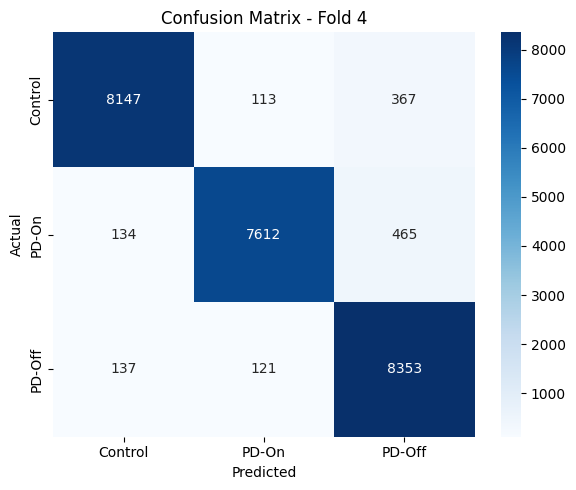

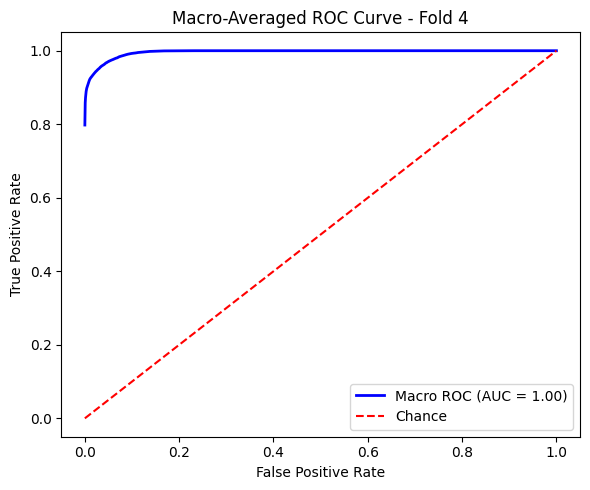


📁 Fold 5
Accuracy:  0.9473
Precision: 0.9488
Recall:    0.9470
F1-Score:  0.9474
AUC Score: 0.9959

Classification Report:
              precision    recall  f1-score   support

     Control       0.97      0.94      0.95      8627
       PD-On       0.97      0.93      0.95      8211
      PD-Off       0.91      0.97      0.94      8611

    accuracy                           0.95     25449
   macro avg       0.95      0.95      0.95     25449
weighted avg       0.95      0.95      0.95     25449



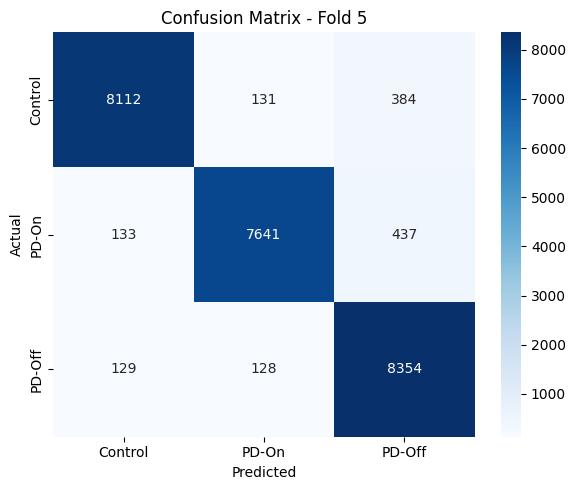

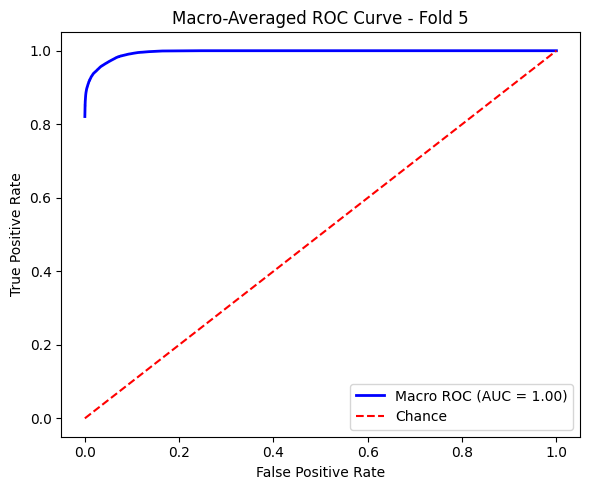


📊 Summary Across Folds:
               fold  accuracy  precision   recall        f1       auc
model                                                                
Random Forest   3.0  0.946277   0.948095  0.94599  0.946443  0.995815


In [10]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
    precision_recall_fscore_support
)
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------
# MODEL NAME & VARIABLES
# ------------------------
model_name = "Random Forest"
class_names = ['Control', 'PD-On', 'PD-Off']
n_classes = len(class_names)

# Ensure y is a NumPy array
if isinstance(y, pd.Series):
    y = y.values
elif isinstance(y, pd.DataFrame):
    y = y.squeeze().values

# Storage for all folds
fold_results = []
all_y_prob_rf = []  # For probabilities across all folds
all_y_true_rf = []  # For true labels across all folds

# ------------------------
# CROSS-VALIDATION LOOP
# ------------------------
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    print(f"\n📁 Fold {fold}")

    # Split
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # Standardize
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Model
    model = RandomForestClassifier(
        n_estimators=300,
        max_depth=20,
        min_samples_leaf=2,
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )
    model.fit(X_train_scaled, y_train)

    # Predictions
    y_pred = model.predict(X_test_scaled)
    y_proba = model.predict_proba(X_test_scaled)

    # Save for aggregate ROC later
    all_y_prob_rf.append(y_proba)
    all_y_true_rf.append(y_test)

    # Metrics
    acc = np.mean(y_pred == y_test)
    prec, rec, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    auc_score = roc_auc_score(y_test_bin, y_proba, average='macro', multi_class='ovr')

    fold_results.append({
        "fold": fold,
        "model": model_name,
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "auc": auc_score
    })

    # Reports
    print(f"Accuracy:  {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall:    {rec:.4f}")
    print(f"F1-Score:  {f1:.4f}")
    print(f"AUC Score: {auc_score:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=class_names))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix - Fold {fold}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

    # 📉 ROC Curve (macro-averaged)
    fpr = dict()
    tpr = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_proba[:, i])

    # Compute macro-average ROC
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes

    plt.figure(figsize=(6, 5))
    plt.plot(all_fpr, mean_tpr, color='blue', lw=2, label=f'Macro ROC (AUC = {auc_score:.2f})')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--', lw=1.5, label='Chance')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Macro-Averaged ROC Curve - Fold {fold}')
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()

# ------------------------
# AGGREGATE STORAGE
# ------------------------
all_y_prob_rf = np.vstack(all_y_prob_rf)
all_y_true_rf = np.concatenate(all_y_true_rf)

# ------------------------
# SUMMARY PRINT ONLY
# ------------------------
results_df = pd.DataFrame(fold_results)
print("\n📊 Summary Across Folds:")
print(results_df.groupby("model").mean(numeric_only=True))


# ***Decision Tree***

In [11]:
#!pip install plotly


📁 Fold 1
Accuracy:  0.9022
Precision: 0.9021
Recall:    0.9022
F1-Score:  0.9021
AUC Score: 0.9421

Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.91      0.91      8627
       PD-On       0.89      0.90      0.90      8210
      PD-Off       0.90      0.89      0.90      8612

    accuracy                           0.90     25449
   macro avg       0.90      0.90      0.90     25449
weighted avg       0.90      0.90      0.90     25449



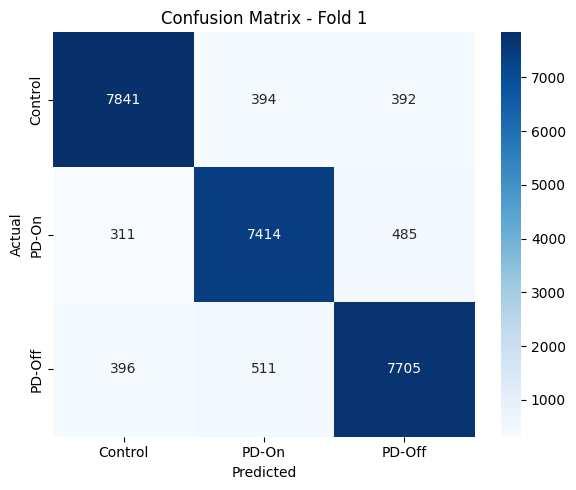

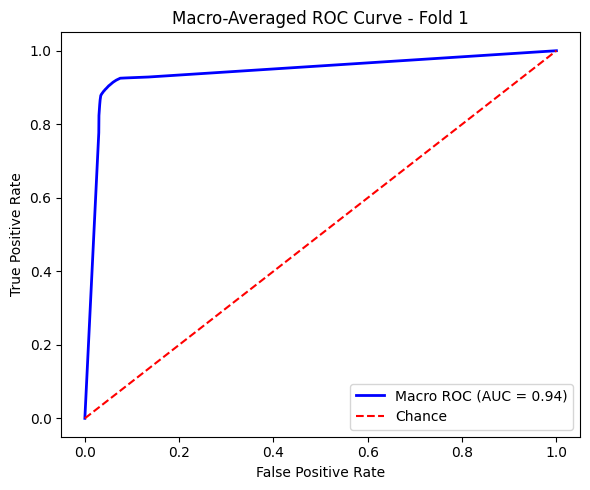


📁 Fold 2
Accuracy:  0.9023
Precision: 0.9023
Recall:    0.9023
F1-Score:  0.9023
AUC Score: 0.9420

Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.90      0.91      8627
       PD-On       0.89      0.90      0.90      8210
      PD-Off       0.90      0.90      0.90      8612

    accuracy                           0.90     25449
   macro avg       0.90      0.90      0.90     25449
weighted avg       0.90      0.90      0.90     25449



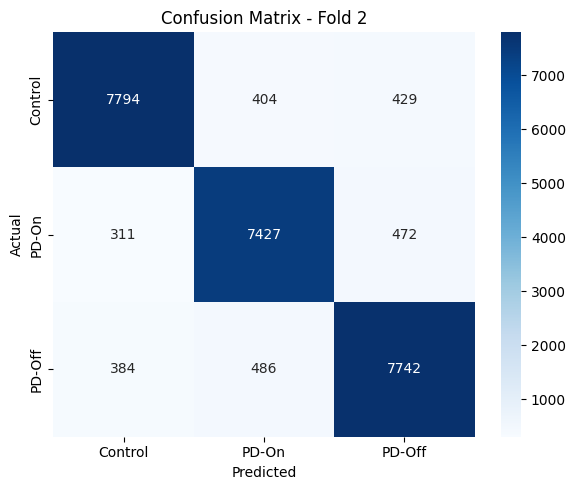

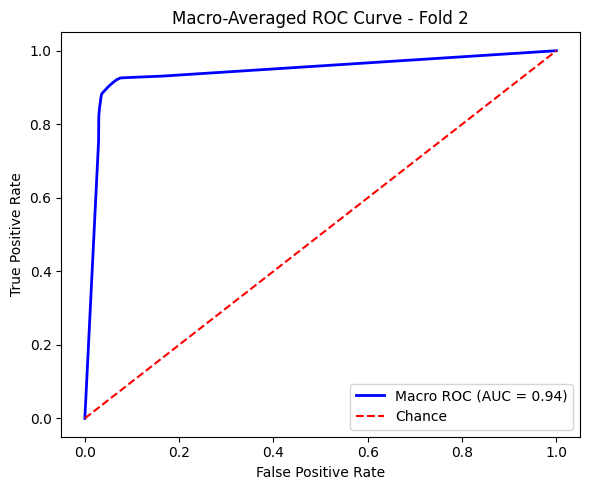


📁 Fold 3
Accuracy:  0.9026
Precision: 0.9025
Recall:    0.9025
F1-Score:  0.9025
AUC Score: 0.9407

Classification Report:
              precision    recall  f1-score   support

     Control       0.91      0.91      0.91      8627
       PD-On       0.90      0.90      0.90      8211
      PD-Off       0.90      0.90      0.90      8611

    accuracy                           0.90     25449
   macro avg       0.90      0.90      0.90     25449
weighted avg       0.90      0.90      0.90     25449



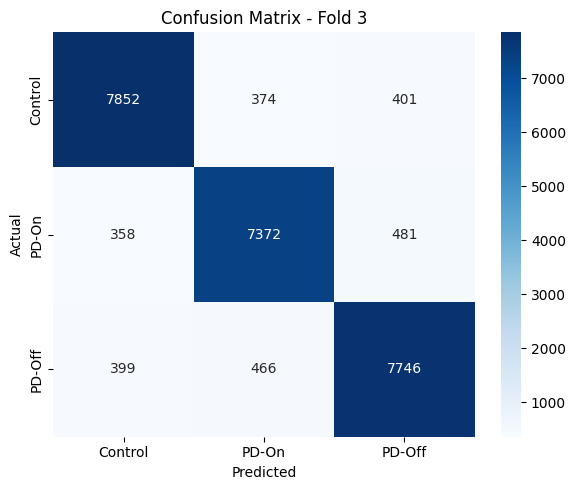

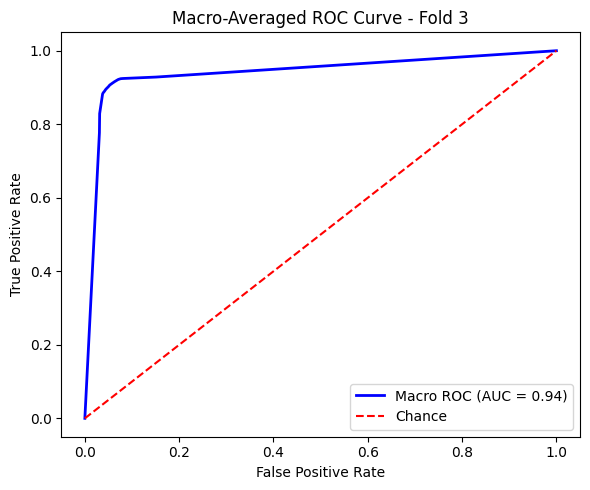


📁 Fold 4
Accuracy:  0.9027
Precision: 0.9026
Recall:    0.9027
F1-Score:  0.9026
AUC Score: 0.9435

Classification Report:
              precision    recall  f1-score   support

     Control       0.92      0.91      0.91      8627
       PD-On       0.89      0.90      0.90      8211
      PD-Off       0.90      0.89      0.90      8611

    accuracy                           0.90     25449
   macro avg       0.90      0.90      0.90     25449
weighted avg       0.90      0.90      0.90     25449



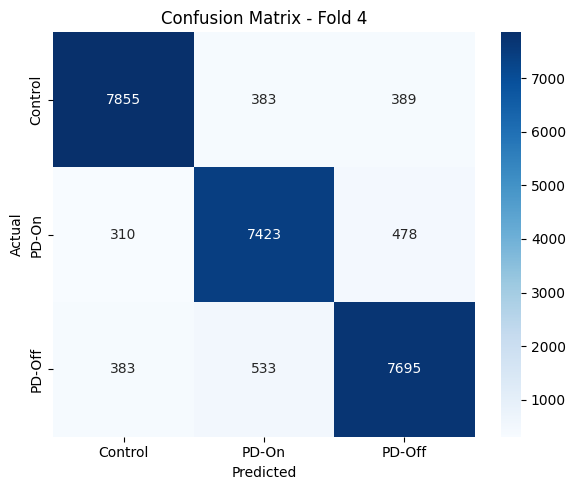

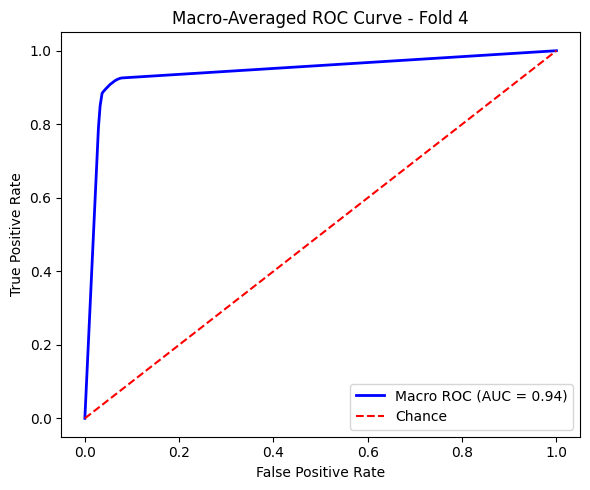


📁 Fold 5
Accuracy:  0.9015
Precision: 0.9014
Recall:    0.9015
F1-Score:  0.9014
AUC Score: 0.9424

Classification Report:
              precision    recall  f1-score   support

     Control       0.91      0.91      0.91      8627
       PD-On       0.89      0.90      0.90      8211
      PD-Off       0.90      0.89      0.90      8611

    accuracy                           0.90     25449
   macro avg       0.90      0.90      0.90     25449
weighted avg       0.90      0.90      0.90     25449



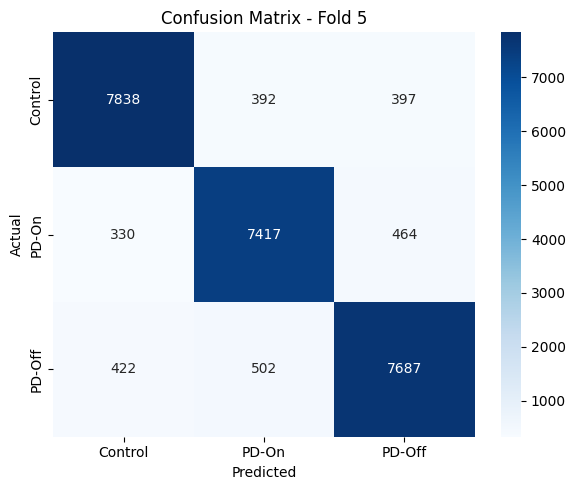

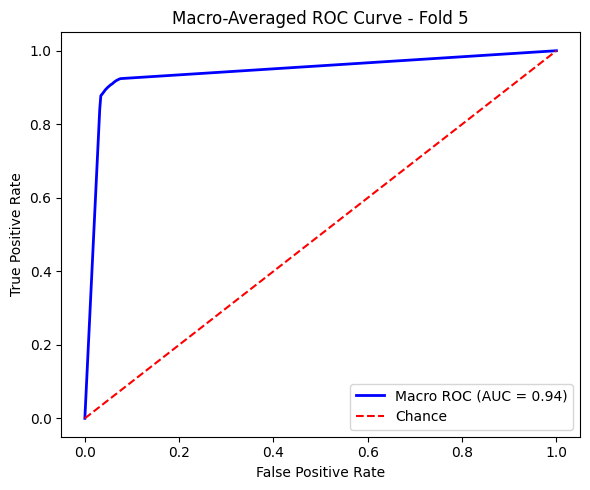


📊 Summary Across Folds:
               fold  accuracy  precision    recall        f1       auc
model                                                                 
Decision Tree   3.0  0.902259   0.902182  0.902261  0.902202  0.942144


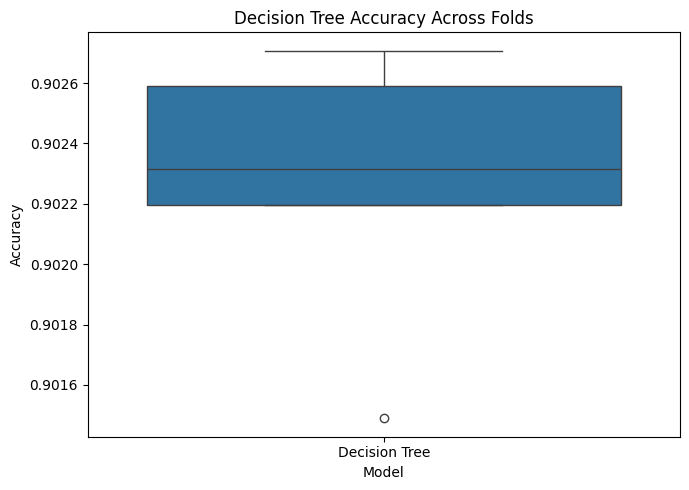

In [12]:
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, precision_recall_fscore_support
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------
# MODEL NAME & VARIABLES
# ------------------------
model_name = "Decision Tree"
class_names = ['Control', 'PD-On', 'PD-Off']
n_classes = len(class_names)

# Ensure y is a NumPy array
if isinstance(y, pd.Series):
    y = y.values
elif isinstance(y, pd.DataFrame):
    y = y.squeeze().values

# Storage for results
fold_results = []
all_y_prob_dt = []  # Probabilities across folds
all_y_true_dt = []  # True labels across folds

# ------------------------
# CROSS-VALIDATION LOOP
# ------------------------
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    print(f"\n📁 Fold {fold}")

    # Split
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # Standardize
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Model
    model = DecisionTreeClassifier(
        criterion='entropy',
        max_depth=20,
        min_samples_split=5,
        min_samples_leaf=3,
        class_weight='balanced',
        random_state=42
    )
    model.fit(X_train_scaled, y_train)

    # Predictions
    y_pred = model.predict(X_test_scaled)
    y_proba = model.predict_proba(X_test_scaled)

    # Save for later aggregate analysis
    all_y_prob_dt.append(y_proba)
    all_y_true_dt.append(y_test)

    # Metrics
    acc = np.mean(y_pred == y_test)
    prec, rec, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    auc_score = roc_auc_score(y_test_bin, y_proba, average='macro', multi_class='ovr')

    fold_results.append({
        "fold": fold,
        "model": model_name,
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "auc": auc_score
    })

    # Reports
    print(f"Accuracy:  {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall:    {rec:.4f}")
    print(f"F1-Score:  {f1:.4f}")
    print(f"AUC Score: {auc_score:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=class_names))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix - Fold {fold}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

   # 📉 ROC Curve (macro-averaged)
    fpr = dict()
    tpr = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_proba[:, i])

    # Compute macro-average ROC
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes

    plt.figure(figsize=(6, 5))
    plt.plot(all_fpr, mean_tpr, color='blue', lw=2, label=f'Macro ROC (AUC = {auc_score:.2f})')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--', lw=1.5, label='Chance')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Macro-Averaged ROC Curve - Fold {fold}')
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()

# ------------------------
# AGGREGATE STORAGE
# ------------------------
all_y_prob_dt = np.vstack(all_y_prob_dt)  # Shape: (total_samples, n_classes)
all_y_true_dt = np.concatenate(all_y_true_dt)  # Shape: (total_samples,)

# ------------------------
# SUMMARY
# ------------------------
results_df = pd.DataFrame(fold_results)
print("\n📊 Summary Across Folds:")
print(results_df.groupby("model").mean(numeric_only=True))

# Example accuracy plot
plt.figure(figsize=(7, 5))
sns.boxplot(data=results_df, x="model", y="accuracy")
plt.title(f"{model_name} Accuracy Across Folds")
plt.ylabel("Accuracy")
plt.xlabel("Model")
plt.tight_layout()
plt.show()


In [13]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# === Plot the Final Decision Tree Model with Adjustments ===
plt.figure(figsize=(150, 75))  # Decrease the size of the figure to avoid overcrowding

# Visualizing the decision tree using plot_tree function
plot_tree(
    model,  # The trained decision tree model
    filled=True,  # Color the nodes to make them more readable
    feature_names=['Feature' + str(i) for i in range(X_train_scaled.shape[1])],  # Feature names (e.g., Feature0, Feature1, ...)
    class_names=class_names,  # Class names for each target class (Control, PD-On, PD-Off)
    rounded=True,  # Round the corners of the nodes for better aesthetics
    fontsize=10,  # Reduce font size to avoid overcrowding
    proportion=True,  # Show proportion of samples in each node
    precision=2  # Precision of float values displayed on the tree
)

# Add a title to the plot
plt.title("Final Decision Tree Visualization", fontsize=8)

# Adjust layout to avoid clipping of labels and titles
plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.05)

# Display the plot
plt.show()



### Step 4.2 : Train Support Vector Machine Classifier

In [14]:
# # import numpy as np
# import pandas as pd
# from sklearn.svm import SVC
# from sklearn.preprocessing import StandardScaler, label_binarize
# from sklearn.model_selection import StratifiedKFold
# from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, precision_recall_fscore_support
# import matplotlib.pyplot as plt
# import seaborn as sns

# # ------------------------
# # MODEL NAME & VARIABLES
# # ------------------------
# model_name = "SVM"
# class_names = ['Control', 'PD-On', 'PD-Off']
# n_classes = len(class_names)

# # Ensure y is a NumPy array
# if isinstance(y, pd.Series):
#     y = y.values
# elif isinstance(y, pd.DataFrame):
#     y = y.squeeze().values

# # Storage for results
# fold_results = []
# all_y_prob_svm = []  # Probabilities across folds
# all_y_true_svm = []  # True labels across folds

# # ------------------------
# # CROSS-VALIDATION LOOP
# # ------------------------
# skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
#     print(f"\n📁 Fold {fold}")

#     # Split
#     X_train, X_test = X[train_idx], X[test_idx]
#     y_train, y_test = y[train_idx], y[test_idx]

#     # Standardize
#     scaler = StandardScaler()
#     X_train_scaled = scaler.fit_transform(X_train)
#     X_test_scaled = scaler.transform(X_test)

#     # Model
#     model = SVC(
#         kernel='linear',         # Adjustable kernel
#         C=1,                     # Regularization parameter
#         class_weight='balanced', # Handle class imbalance
#         probability=True,        # Enable probability estimates
#         random_state=42
#     )
#     model.fit(X_train_scaled, y_train)

#     # Predictions
#     y_pred = model.predict(X_test_scaled)
#     y_proba = model.predict_proba(X_test_scaled)

#     # Save for later aggregate analysis
#     all_y_prob_svm.append(y_proba)
#     all_y_true_svm.append(y_test)

#     # Metrics
#     acc = np.mean(y_pred == y_test)
#     prec, rec, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')
#     y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
#     auc_score = roc_auc_score(y_test_bin, y_proba, average='macro', multi_class='ovr')

#     fold_results.append({
#         "fold": fold,
#         "model": model_name,
#         "accuracy": acc,
#         "precision": prec,
#         "recall": rec,
#         "f1": f1,
#         "auc": auc_score
#     })

#     # Reports
#     print(f"Accuracy:  {acc:.4f}")
#     print(f"Precision: {prec:.4f}")
#     print(f"Recall:    {rec:.4f}")
#     print(f"F1-Score:  {f1:.4f}")
#     print(f"AUC Score: {auc_score:.4f}")
#     print("\nClassification Report:")
#     print(classification_report(y_test, y_pred, target_names=class_names))

#     # Confusion Matrix
#     cm = confusion_matrix(y_test, y_pred)
#     plt.figure(figsize=(6, 5))
#     sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
#                 xticklabels=class_names, yticklabels=class_names)
#     plt.title(f'Confusion Matrix - Fold {fold}')
#     plt.xlabel('Predicted')
#     plt.ylabel('Actual')
#     plt.tight_layout()
#     plt.show()

#    # 📉 ROC Curve (macro-averaged)
#     fpr = dict()
#     tpr = dict()
#     for i in range(n_classes):
#         fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_proba[:, i])

#     # Compute macro-average ROC
#     all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
#     mean_tpr = np.zeros_like(all_fpr)
#     for i in range(n_classes):
#         mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
#     mean_tpr /= n_classes

#     plt.figure(figsize=(6, 5))
#     plt.plot(all_fpr, mean_tpr, color='blue', lw=2, label=f'Macro ROC (AUC = {auc_score:.2f})')
#     plt.plot([0, 1], [0, 1], color='red', linestyle='--', lw=1.5, label='Chance')
#     plt.xlabel('False Positive Rate')
#     plt.ylabel('True Positive Rate')
#     plt.title(f'Macro-Averaged ROC Curve - Fold {fold}')
#     plt.legend(loc='lower right')
#     plt.tight_layout()
#     plt.show()

# # ------------------------
# # AGGREGATE STORAGE
# # ------------------------
# all_y_prob_svm = np.vstack(all_y_prob_svm)  # Shape: (total_samples, n_classes)
# all_y_true_svm = np.concatenate(all_y_true_svm)  # Shape: (total_samples,)

# # ------------------------
# # SUMMARY
# # ------------------------
# results_df = pd.DataFrame(fold_results)
# print("\n📊 Summary Across Folds:")
# print(results_df.groupby("model").mean(numeric_only=True))

# # Example accuracy plot
# plt.figure(figsize=(7, 5))
# sns.boxplot(data=results_df, x="model", y="accuracy")
# plt.title(f"{model_name} Accuracy Across Folds")
# plt.ylabel("Accuracy")
# plt.xlabel("Model")
# plt.tight_layout()
# plt.show()

## Step 4.3: Train Logistic Regression Classifier


📁 Fold 1


/opt/anaconda3/envs/EEG_tut/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Accuracy:  0.3447
Precision: 0.3146
Recall:    0.3395
F1-Score:  0.2834
AUC Score: 0.5017

Classification Report:
              precision    recall  f1-score   support

     Control       0.35      0.53      0.42      8627
       PD-On       0.25      0.02      0.03      8210
      PD-Off       0.34      0.47      0.40      8612

    accuracy                           0.34     25449
   macro avg       0.31      0.34      0.28     25449
weighted avg       0.32      0.34      0.29     25449



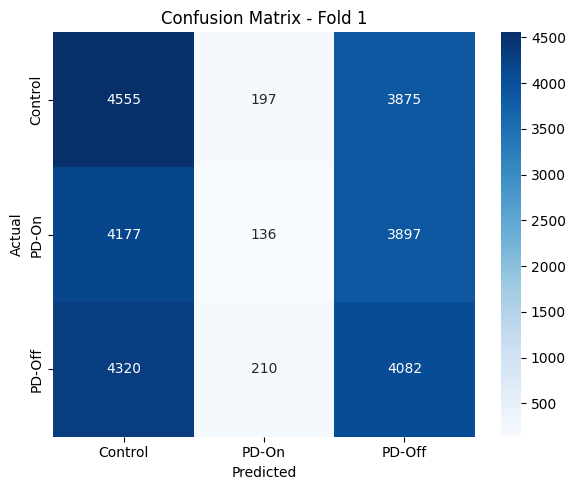

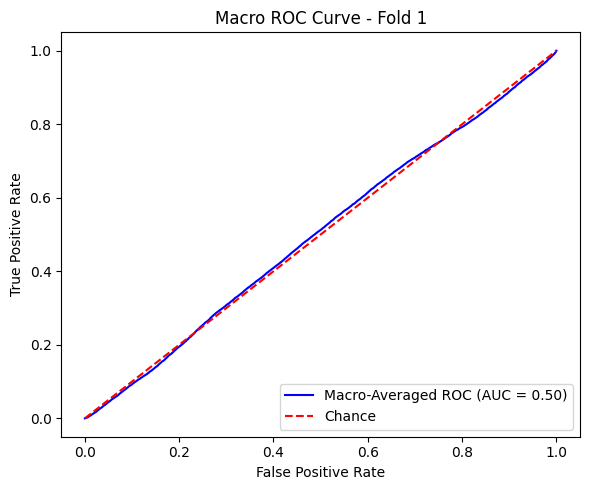


📁 Fold 2
Accuracy:  0.3234
Precision: 0.2975
Recall:    0.3184
F1-Score:  0.2642
AUC Score: 0.4896

Classification Report:


/opt/anaconda3/envs/EEG_tut/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


              precision    recall  f1-score   support

     Control       0.33      0.55      0.41      8627
       PD-On       0.24      0.02      0.03      8210
      PD-Off       0.32      0.39      0.36      8612

    accuracy                           0.32     25449
   macro avg       0.30      0.32      0.26     25449
weighted avg       0.30      0.32      0.27     25449



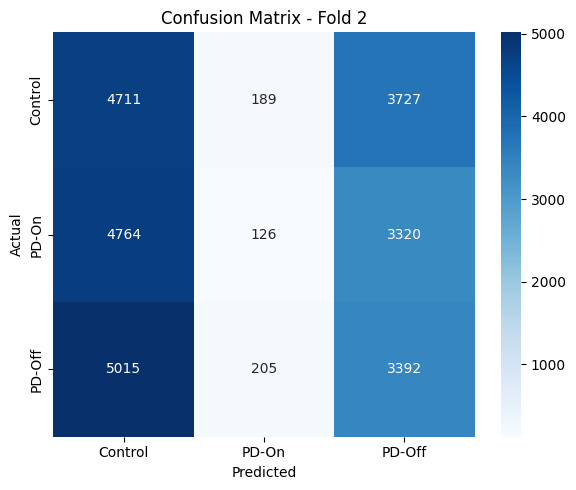

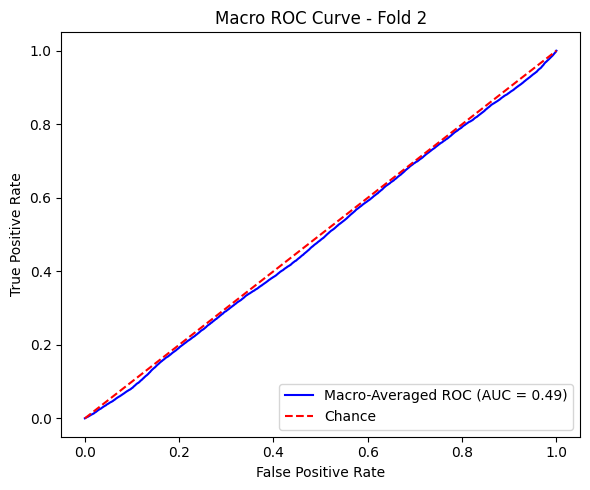


📁 Fold 3
Accuracy:  0.3232
Precision: 0.2979
Recall:    0.3183
F1-Score:  0.2645
AUC Score: 0.4801

Classification Report:


/opt/anaconda3/envs/EEG_tut/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


              precision    recall  f1-score   support

     Control       0.32      0.54      0.40      8627
       PD-On       0.24      0.02      0.03      8211
      PD-Off       0.33      0.40      0.36      8611

    accuracy                           0.32     25449
   macro avg       0.30      0.32      0.26     25449
weighted avg       0.30      0.32      0.27     25449



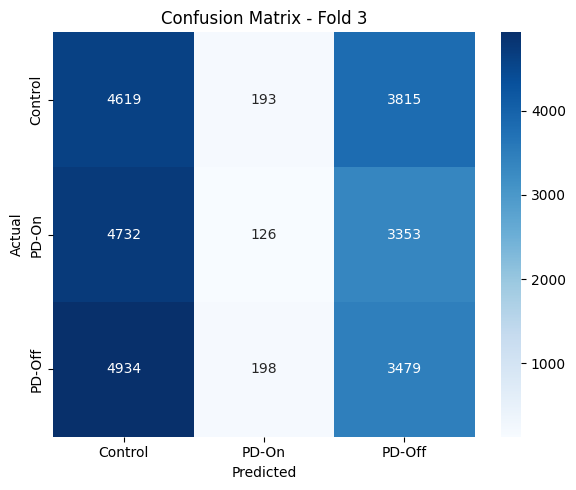

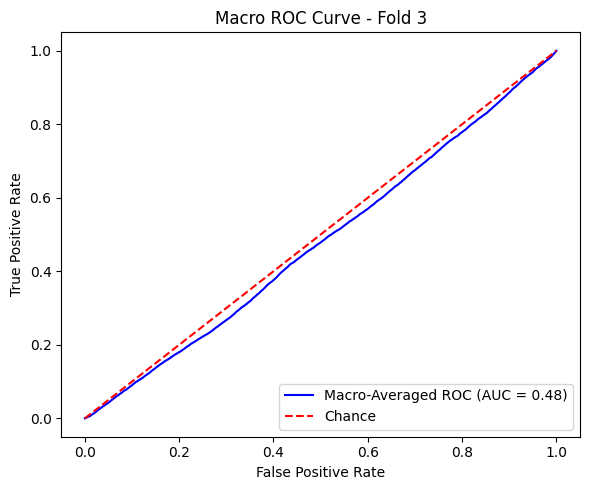


📁 Fold 4


/opt/anaconda3/envs/EEG_tut/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Accuracy:  0.3278
Precision: 0.3067
Recall:    0.3230
F1-Score:  0.2743
AUC Score: 0.4870

Classification Report:
              precision    recall  f1-score   support

     Control       0.33      0.52      0.40      8627
       PD-On       0.26      0.03      0.05      8211
      PD-Off       0.33      0.42      0.37      8611

    accuracy                           0.33     25449
   macro avg       0.31      0.32      0.27     25449
weighted avg       0.31      0.33      0.28     25449



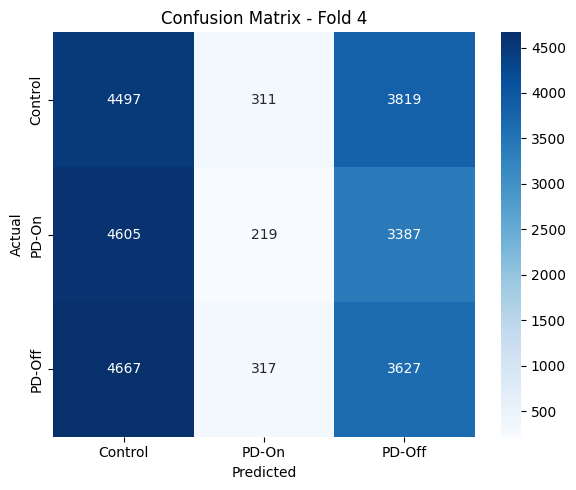

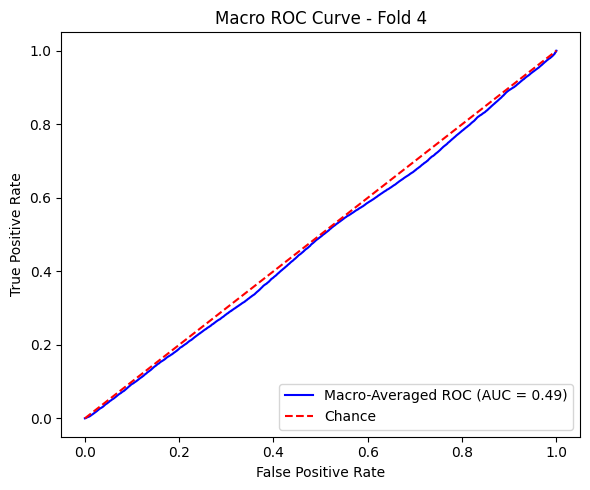


📁 Fold 5


/opt/anaconda3/envs/EEG_tut/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Accuracy:  0.3277
Precision: 0.3036
Recall:    0.3228
F1-Score:  0.2712
AUC Score: 0.4799

Classification Report:
              precision    recall  f1-score   support

     Control       0.34      0.53      0.41      8627
       PD-On       0.25      0.02      0.04      8211
      PD-Off       0.32      0.42      0.36      8611

    accuracy                           0.33     25449
   macro avg       0.30      0.32      0.27     25449
weighted avg       0.30      0.33      0.27     25449



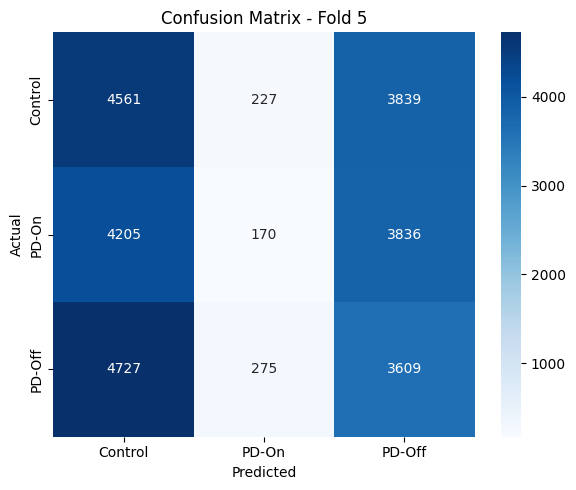

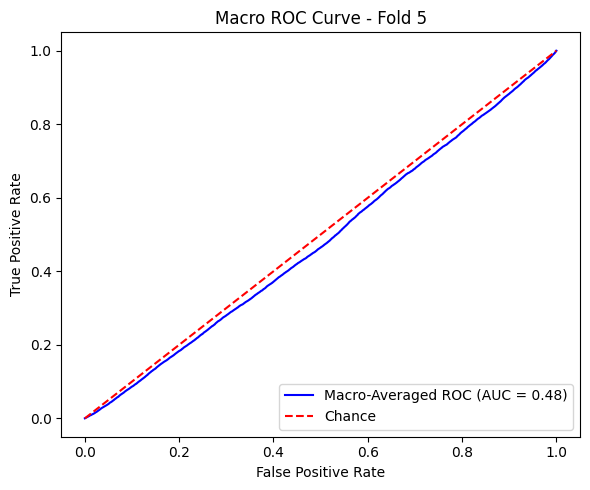


📊 Overall Cross-Validation Summary:
Mean Accuracy : 0.3294
Mean Precision: 0.3041
Mean Recall   : 0.3244
Mean F1       : 0.2715
Mean Auc      : 0.4876


In [15]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import precision_recall_fscore_support

# Assuming X and y have been processed and are available
if isinstance(y, pd.Series):
    y = y.values
elif isinstance(y, pd.DataFrame):
    y = y.squeeze().values

# 🎯 Class names
class_names = ['Control', 'PD-On', 'PD-Off']
n_classes = len(class_names)

# ⚙️ Cross-Validation Setup
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 🧪 Metrics tracking
all_metrics = {
    "accuracy": [],
    "precision": [],
    "recall": [],
    "f1": [],
    "auc": []
}

# 📥 Store all predictions for ROC curves later
all_y_true_logreg = []
all_y_prob_logreg = []

# 🔄 Fold Loop
for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    print(f"\n📁 Fold {fold}")
    
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    # ⚖️ Preprocessing
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # 🌳 Logistic Regression Model
    model = LogisticRegression(
        max_iter=1000,
        class_weight='balanced',
        random_state=42,
        multi_class='ovr',
        solver='liblinear'
    )
    model.fit(X_train_scaled, y_train)
    
    # Predictions
    y_pred = model.predict(X_test_scaled)
    y_proba = model.predict_proba(X_test_scaled)
    
    # Append for overall storage
    all_y_true_logreg.extend(y_test)
    all_y_prob_logreg.extend(y_proba)
    
    # Metrics
    acc = np.mean(y_pred == y_test)
    prec, rec, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    auc_score = roc_auc_score(y_test_bin, y_proba, average='macro', multi_class='ovr')

    all_metrics["accuracy"].append(acc)
    all_metrics["precision"].append(prec)
    all_metrics["recall"].append(rec)
    all_metrics["f1"].append(f1)
    all_metrics["auc"].append(auc_score)

    # Reports
    print(f"Accuracy:  {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall:    {rec:.4f}")
    print(f"F1-Score:  {f1:.4f}")
    print(f"AUC Score: {auc_score:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=class_names))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix - Fold {fold}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

    # ROC Curve
    fpr, tpr = {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_proba[:, i])
    
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    
    plt.figure(figsize=(6, 5))
    plt.plot(all_fpr, mean_tpr, color='blue', label=f'Macro-Averaged ROC (AUC = {auc_score:.2f})')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Chance')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Macro ROC Curve - Fold {fold}')
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()

# Convert to numpy arrays for compatibility
all_y_true_logreg = np.array(all_y_true_logreg)
all_y_prob_logreg = np.array(all_y_prob_logreg)

# 📊 Overall Summary
print("\n📊 Overall Cross-Validation Summary:")
for key in all_metrics:
    mean_val = np.mean(all_metrics[key])
    print(f"Mean {key.capitalize():<9}: {mean_val:.4f}")


## **Transformer Model**

In [16]:
#!pip install torch torchvision

In [17]:
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

**BLOCK 1: Preprocessing and DataLoader**

In [18]:
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
import torch
from torch.utils.data import DataLoader, TensorDataset
import numpy as np

# Entire dataset (X and y)
X = np.concatenate([X_train, X_test], axis=0)  # shape (4497, 160)
y = np.concatenate([y_train, y_test], axis=0)  # shape (4497,)

X = X.astype(np.float32)
y = y.astype(np.int64)

# K-Fold cross-validation will split this
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Store all folds' loaders, weights, scalers
fold_data = []

for fold_idx, (train_idx, val_idx) in enumerate(skf.split(X, y), 1):
    print(f"📂 Preparing Fold {fold_idx}...")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]

    # Standardize using only training set
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train)
    X_val_std = scaler.transform(X_val)

    # Convert to PyTorch tensors
    X_train_tensor = torch.tensor(X_train_std, dtype=torch.float32)
    X_val_tensor = torch.tensor(X_val_std, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    y_val_tensor = torch.tensor(y_val, dtype=torch.long)

    # Compute class weights for this fold
    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32)

    # Create DataLoaders
    batch_size = 64
    train_loader = DataLoader(TensorDataset(X_train_tensor, y_train_tensor), batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(TensorDataset(X_val_tensor, y_val_tensor), batch_size=batch_size)

    fold_data.append({
        'train_loader': train_loader,
        'val_loader': val_loader,
        'class_weights': class_weights_tensor,
        'scaler': scaler,
        'X_val': X_val_std,
        'y_val': y_val,
    })



📂 Preparing Fold 1...
📂 Preparing Fold 2...
📂 Preparing Fold 3...
📂 Preparing Fold 4...
📂 Preparing Fold 5...


**BLOCK 2: Transformer Model Definition**


📁 ===== Fold 1 =====

🌟 Epoch 1/40 — Fold 1


✅ Train Loss: 0.7642 | Train Acc: 0.6274

🌟 Epoch 2/40 — Fold 1


✅ Train Loss: 0.4593 | Train Acc: 0.8010

🌟 Epoch 3/40 — Fold 1


✅ Train Loss: 0.3693 | Train Acc: 0.8427

🌟 Epoch 4/40 — Fold 1


✅ Train Loss: 0.3218 | Train Acc: 0.8636

🌟 Epoch 5/40 — Fold 1


✅ Train Loss: 0.2889 | Train Acc: 0.8779

🌟 Epoch 6/40 — Fold 1


✅ Train Loss: 0.2651 | Train Acc: 0.8875

🌟 Epoch 7/40 — Fold 1


✅ Train Loss: 0.2493 | Train Acc: 0.8950

🌟 Epoch 8/40 — Fold 1


✅ Train Loss: 0.2319 | Train Acc: 0.9016

🌟 Epoch 9/40 — Fold 1


✅ Train Loss: 0.2183 | Train Acc: 0.9078

🌟 Epoch 10/40 — Fold 1


✅ Train Loss: 0.2109 | Train Acc: 0.9109

🌟 Epoch 11/40 — Fold 1


✅ Train Loss: 0.1955 | Train Acc: 0.9165

🌟 Epoch 12/40 — Fold 1


✅ Train Loss: 0.1864 | Train Acc: 0.9209

🌟 Epoch 13/40 — Fold 1


✅ Train Loss: 0.1747 | Train Acc: 0.9248

🌟 Epoch 14/40 — Fold 1


✅ Train Loss: 0.1665 | Train Acc: 0.9287

🌟 Epoch 15/40 — Fold 1


✅ Train Loss: 0.1577 | Train Acc: 0.9323

🌟 Epoch 16/40 — Fold 1


✅ Train Loss: 0.1505 | Train Acc: 0.9350

🌟 Epoch 17/40 — Fold 1


✅ Train Loss: 0.1406 | Train Acc: 0.9395

🌟 Epoch 18/40 — Fold 1


✅ Train Loss: 0.1361 | Train Acc: 0.9421

🌟 Epoch 19/40 — Fold 1


✅ Train Loss: 0.1269 | Train Acc: 0.9452

🌟 Epoch 20/40 — Fold 1


✅ Train Loss: 0.1199 | Train Acc: 0.9478

🌟 Epoch 21/40 — Fold 1


✅ Train Loss: 0.1120 | Train Acc: 0.9513

🌟 Epoch 22/40 — Fold 1


✅ Train Loss: 0.1080 | Train Acc: 0.9535

🌟 Epoch 23/40 — Fold 1


✅ Train Loss: 0.1020 | Train Acc: 0.9561

🌟 Epoch 24/40 — Fold 1


✅ Train Loss: 0.0975 | Train Acc: 0.9575

🌟 Epoch 25/40 — Fold 1


✅ Train Loss: 0.0924 | Train Acc: 0.9598

🌟 Epoch 26/40 — Fold 1


✅ Train Loss: 0.0872 | Train Acc: 0.9623

🌟 Epoch 27/40 — Fold 1


✅ Train Loss: 0.0837 | Train Acc: 0.9637

🌟 Epoch 28/40 — Fold 1


✅ Train Loss: 0.0800 | Train Acc: 0.9651

🌟 Epoch 29/40 — Fold 1


✅ Train Loss: 0.0781 | Train Acc: 0.9660

🌟 Epoch 30/40 — Fold 1


✅ Train Loss: 0.0757 | Train Acc: 0.9674

🌟 Epoch 31/40 — Fold 1


✅ Train Loss: 0.0725 | Train Acc: 0.9685

🌟 Epoch 32/40 — Fold 1


✅ Train Loss: 0.0727 | Train Acc: 0.9685

🌟 Epoch 33/40 — Fold 1


✅ Train Loss: 0.0706 | Train Acc: 0.9687

🌟 Epoch 34/40 — Fold 1


✅ Train Loss: 0.0701 | Train Acc: 0.9699

🌟 Epoch 35/40 — Fold 1


✅ Train Loss: 0.0685 | Train Acc: 0.9702

🌟 Epoch 36/40 — Fold 1


✅ Train Loss: 0.0689 | Train Acc: 0.9697

🌟 Epoch 37/40 — Fold 1


✅ Train Loss: 0.0697 | Train Acc: 0.9700

🌟 Epoch 38/40 — Fold 1


✅ Train Loss: 0.0690 | Train Acc: 0.9697

🌟 Epoch 39/40 — Fold 1


✅ Train Loss: 0.0686 | Train Acc: 0.9706

🌟 Epoch 40/40 — Fold 1


✅ Train Loss: 0.0693 | Train Acc: 0.9699

📊 Classification Report:
              precision    recall  f1-score   support

         CTL     0.9585    0.9313    0.9447      8627
       PD-On     0.9408    0.9389    0.9398      8210
      PD-Off     0.9225    0.9505    0.9363      8612

    accuracy                         0.9402     25449
   macro avg     0.9406    0.9402    0.9403     25449
weighted avg     0.9406    0.9402    0.9403     25449



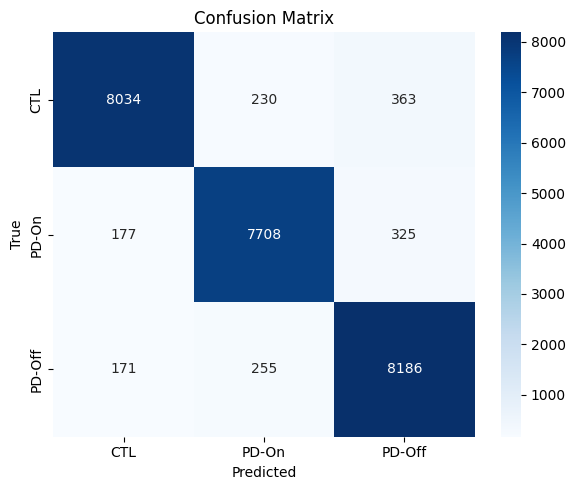

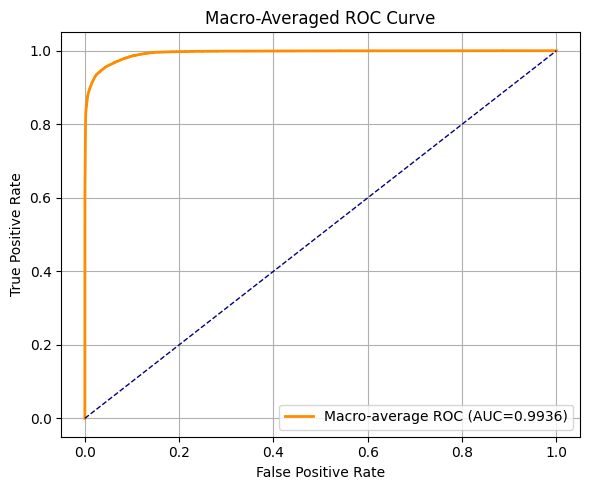


📁 ===== Fold 2 =====

🌟 Epoch 1/40 — Fold 2


✅ Train Loss: 0.6764 | Train Acc: 0.6835

🌟 Epoch 2/40 — Fold 2


✅ Train Loss: 0.4475 | Train Acc: 0.8058

🌟 Epoch 3/40 — Fold 2


✅ Train Loss: 0.3657 | Train Acc: 0.8450

🌟 Epoch 4/40 — Fold 2


✅ Train Loss: 0.3199 | Train Acc: 0.8657

🌟 Epoch 5/40 — Fold 2


✅ Train Loss: 0.2871 | Train Acc: 0.8791

🌟 Epoch 6/40 — Fold 2


✅ Train Loss: 0.2672 | Train Acc: 0.8870

🌟 Epoch 7/40 — Fold 2


✅ Train Loss: 0.2448 | Train Acc: 0.8970

🌟 Epoch 8/40 — Fold 2


✅ Train Loss: 0.2297 | Train Acc: 0.9035

🌟 Epoch 9/40 — Fold 2


✅ Train Loss: 0.2151 | Train Acc: 0.9094

🌟 Epoch 10/40 — Fold 2


✅ Train Loss: 0.2053 | Train Acc: 0.9134

🌟 Epoch 11/40 — Fold 2


✅ Train Loss: 0.1931 | Train Acc: 0.9192

🌟 Epoch 12/40 — Fold 2


Train:  13%|█▏       | 207/1591 [00:02<00:18, 75.36it/s, acc=0.927, loss=0.0728]

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.preprocessing import label_binarize

# -------------------------
# EEGTransformer definition
# -------------------------
class EEGTransformer(nn.Module):
    def __init__(self, input_dim, num_classes=3, embed_dim=256, num_heads=8, num_layers=3, dropout=0.2):
        super().__init__()
        self.embedding = nn.Linear(input_dim, embed_dim)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            dropout=dropout,
            batch_first=True
        )
        self.transformer_encoder = nn.TransformerEncoder(
            encoder_layer,
            num_layers=num_layers
        )
        self.classifier = nn.Sequential(
            nn.Linear(embed_dim, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        x = self.embedding(x).unsqueeze(1)  # (B, 1, embed_dim)
        x = self.transformer_encoder(x)     # (B, 1, embed_dim)
        x = x.squeeze(1)                    # (B, embed_dim)
        return self.classifier(x)           # (B, num_classes)

# -------------------------
# Training and evaluation
# -------------------------
def train_one_epoch(model, loader, optimizer, loss_fn, scheduler, device):
    model.train()
    total_loss = 0
    correct, total = 0, 0
    loop = tqdm(loader, desc="Train", leave=False)
    for xb, yb in loop:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = loss_fn(preds, yb)
        loss.backward()
        optimizer.step()
        scheduler.step()
        total_loss += loss.item()
        correct += (preds.argmax(1) == yb).sum().item()
        total += yb.size(0)
        loop.set_postfix(loss=loss.item(), acc=correct/total)
    avg_loss = total_loss / len(loader)
    avg_acc = correct / total
    return avg_loss, avg_acc

def evaluate(model, loader, device, return_preds=False):
    model.eval()
    y_true, y_pred, y_prob = [], [], []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            logits = model(xb)
            probs = torch.softmax(logits, dim=1).cpu().numpy()
            preds = logits.argmax(1).cpu().numpy()
            y_prob.extend(probs)
            y_pred.extend(preds)
            y_true.extend(yb.numpy())
    if return_preds:
        return y_true, y_pred, y_prob

# Confusion matrix plotting
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    df_cm = pd.DataFrame(cm, index=["CTL","PD-On","PD-Off"], columns=["CTL","PD-On","PD-Off"])
    plt.figure(figsize=(6,5))
    sns.heatmap(df_cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.ylabel("True")
    plt.xlabel("Predicted")
    plt.tight_layout()
    plt.show()

def plot_macro_roc_curve(y_true, y_prob):
    y_true_bin = label_binarize(y_true, classes=[0,1,2])
    y_prob = np.array(y_prob)
    fpr, tpr, _ = roc_curve(y_true_bin.ravel(), y_prob.ravel())
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(6,5))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"Macro-average ROC (AUC={roc_auc:.4f})")
    plt.plot([0,1], [0,1], color='navy', lw=1, linestyle='--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Macro-Averaged ROC Curve")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# -------------------------
# Full K-Fold Training
# -------------------------
num_epochs = 40
all_y_true, all_y_pred, all_y_prob = [], [], []

input_dim = X_train.shape[1]  # <-- 50
num_classes = 3
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

for fold_idx, fold in enumerate(fold_data, 1):
    print(f"\n📁 ===== Fold {fold_idx} =====")
    train_loader = fold["train_loader"]
    val_loader = fold["val_loader"]
    class_weights = fold["class_weights"]

    # Initialize model
    model = EEGTransformer(input_dim=input_dim, num_classes=num_classes).to(device)
    loss_fn = nn.CrossEntropyLoss(weight=class_weights.to(device))
    optimizer = optim.AdamW(model.parameters(), lr=5e-4)
    total_steps = len(train_loader) * num_epochs
    warmup_steps = int(0.1 * total_steps)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=total_steps-warmup_steps)

    # Train loop
    for epoch in range(1, num_epochs+1):
        print(f"\n🌟 Epoch {epoch}/{num_epochs} — Fold {fold_idx}")
        train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, loss_fn, scheduler, device)
        print(f"✅ Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")

    # Evaluate on validation set
    y_true, y_pred, y_prob = evaluate(model, val_loader, device, return_preds=True)
    print("\n📊 Classification Report:")
    print(classification_report(y_true, y_pred, target_names=["CTL","PD-On","PD-Off"], digits=4))
    plot_confusion_matrix(y_true, y_pred)
    plot_macro_roc_curve(y_true, y_prob)

    # Collect all folds for combined stats
    all_y_true.extend(y_true)
    all_y_pred.extend(y_pred)
    all_y_prob.extend(y_prob)


**BLOCK 3: Training Setup**

In [ ]:
#!pip install transformers

**BLOCK 4: Training and Evaluation Loop with tqdm**

**BLOCK 5: Training Loop**

**BLOCK 6:Evauluate**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# Convert all y_prob lists to numpy arrays once to avoid errors
all_y_prob_svm = np.array(all_y_prob_svm)
all_y_prob_transformer = np.array(all_y_prob_transformer)
all_y_prob_logreg = np.array(all_y_prob_logreg)
all_y_prob_dt = np.array(all_y_prob_dt)
all_y_prob_rf = np.array(all_y_prob_rf)

# Dictionary with your models' true labels and predicted probabilities
model_data = {
    "SVM": (all_y_true_svm, all_y_prob_svm),
    "Transformer": (all_y_true_transformer, all_y_prob_transformer),
    "Logistic Regression": (all_y_true_logreg, all_y_prob_logreg),
    "Decision Tree": (all_y_true_dt, all_y_prob_dt),
    "Random Forest": (all_y_true_rf, all_y_prob_rf)
}

class_names = ['Control', 'PD-On', 'PD-Off']
n_classes = len(class_names)

plt.figure(figsize=(10, 8))

for model_name, (y_true, y_proba) in model_data.items():
    # Binarize true labels for multiclass ROC calculation
    y_true_bin = label_binarize(y_true, classes=list(range(n_classes)))

    fpr = dict()
    tpr = dict()

    # Calculate ROC curve and AUC for each class
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])

    # Combine all false positive rates for interpolation
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Interpolate true positive rates and calculate mean TPR (macro-average)
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes

    # Compute macro-average AUC
    macro_auc = auc(all_fpr, mean_tpr)

    # Plot the macro-average ROC curve for this model
    plt.plot(all_fpr, mean_tpr, lw=2, label=f'{model_name} (AUC = {macro_auc:.3f})')

# Plot random chance line
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--', label='Chance')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('📈 Macro-Averaged ROC Curves - All Models')
plt.legend(loc='lower right')
plt.grid(True, linestyle=':')
plt.tight_layout()
plt.show()